In [1]:
%matplotlib inline
%config InlineBackend.figure_format = 'retina'

In [2]:
import arviz as az
from gp_model_new import harmonic_sho_model
from hls import HarmonicLombScargle
import lightkurve as lk
import matplotlib.pyplot as plt
import numpy as np
import pymc as pm
import scipy.stats as ss
import seaborn as sns
from tqdm import tqdm
import pandas as pd
import os
import glob
from astropy.io import fits
from astropy.stats import sigma_clip
import ipywidgets

sns.set_theme(context='notebook', style='ticks', palette='colorblind')

WARNING (pytensor.tensor.blas): Using NumPy C-API based implementation for BLAS functions.


ModuleNotFoundError: No module named 'pymc'

In [3]:
import astropy
ipywidgets.__version__

'8.1.5'

In [4]:
def get_detrended_lc(kepler_id, data_dir):

    search_pattern = os.path.join(data_dir, f"KIC_{kepler_id}", "*.fits")
    fits_files = sorted(glob.glob(search_pattern))

    print(f"Found {len(fits_files)} FITS files for KIC {kepler_id}")

    times_list = []
    fluxes_list = []
    flux_errs_list = []
    quarters_list = []

    for i, fits_file in enumerate(fits_files):
        filename = os.path.basename(fits_file)
        if "q" in filename and filename.split("q")[1][:2].isdigit():
            quarter = int(filename.split("q")[1][:2])
        else:
            quarter = i
        
        with fits.open(fits_file) as hdul:
            data = hdul[1].data
            
            time_data = np.array(data['TIME'], dtype=np.float64)
            flux_data = np.array(data['FLUX_DETREND'], dtype=np.float64)
            flux_err_data = np.array(data['FLUX_DETREND_ERR_EST'], dtype=np.float64)
            
            if time_data.ndim > 1:
                time_data = time_data.flatten()
            if flux_data.ndim > 1:
                flux_data = flux_data.flatten()
            if flux_err_data.ndim > 1:
                flux_err_data = flux_err_data.flatten()
            
            mask = ~np.isnan(flux_data)
            
            valid_time = time_data[mask]
            valid_flux = flux_data[mask]
            valid_flux_err = flux_err_data[mask]
            
            if len(valid_flux) > 0:
                flux_mean = np.mean(valid_flux)
                valid_flux = valid_flux / flux_mean
                valid_flux_err = valid_flux_err / flux_mean  
                
                times_list.append(valid_time)
                fluxes_list.append(valid_flux)
                flux_errs_list.append(valid_flux_err)
                quarters_list.append(np.ones_like(valid_time) * quarter)
            
                print(f"Added {np.sum(mask)} points from quarter {quarter}")


    # After loading all the data and before any plotting or analysis
    if times_list:
        times = np.concatenate(times_list)
        fluxes = np.concatenate(fluxes_list)
        flux_errs = np.concatenate(flux_errs_list)
        quarters = np.concatenate(quarters_list)
    
        uquarters, quarter_indices = np.unique(quarters, return_inverse=True)
        
        # Apply sigma clipping by quarter to handle different flux levels
        clipped_indices = []
        for quarter in uquarters:
            q_mask = quarters == quarter
            q_fluxes = fluxes[q_mask]
            
            # Identify outliers using sigma_clip
            # Adjust sigma and maxiters as needed
            filtered_data = sigma_clip(q_fluxes, sigma=5, maxiters=5)
            quarter_outliers = np.where(q_mask)[0][filtered_data.mask]
            clipped_indices.extend(quarter_outliers)
        
        # Create mask for all valid data points (not outliers)
        valid_mask = np.ones(len(fluxes), dtype=bool)
        valid_mask[clipped_indices] = False
        
        # Apply the mask to all data
        times = times[valid_mask]
        fluxes = fluxes[valid_mask]
        flux_errs = flux_errs[valid_mask]
        quarters = quarters[valid_mask]
        
        # Update quarter indices after clipping
        uquarters, quarter_indices = np.unique(quarters, return_inverse=True)
        
        print(f"Removed {len(clipped_indices)} outlier points using sigma clipping")
    else:
        print("No valid data found")
    
    return times, fluxes, flux_errs, quarters, quarter_indices

In [5]:
kepler_id = 4936891
data_dir = "kepler_detrended"  

times, fluxes, flux_errs, quarters, quarter_indices = get_detrended_lc(kepler_id,data_dir)

Found 14 FITS files for KIC 4936891
Added 1626 points from quarter 1
Added 4076 points from quarter 2
Added 4142 points from quarter 3
Added 4118 points from quarter 4
Added 4492 points from quarter 5
Added 4229 points from quarter 7
Added 3114 points from quarter 8
Added 4618 points from quarter 9
Added 4520 points from quarter 11
Added 3564 points from quarter 12
Added 4304 points from quarter 13
Added 4386 points from quarter 15
Added 3552 points from quarter 16
Added 1287 points from quarter 17
Removed 32 outlier points using sigma clipping


Text(0.5, 1.0, '4936891')

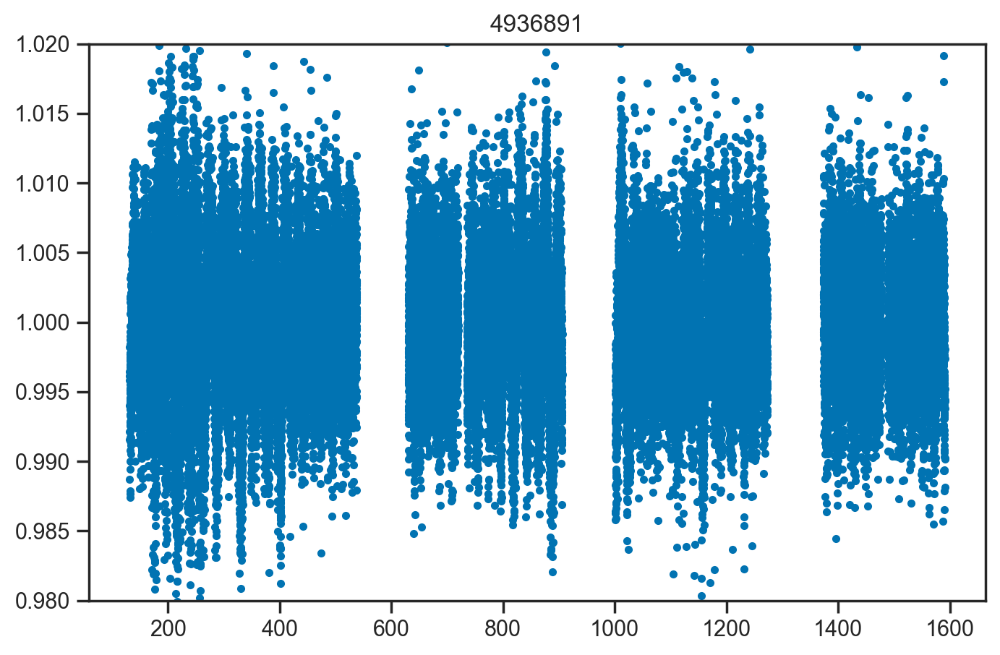

In [6]:
plt.figure(figsize=(8,5))
plt.plot(times, fluxes, '.')
# plt.xlim(300,420)
plt.ylim(0.98,1.02)
plt.title(kepler_id)

In [7]:
f_best_literature = 1/22.2

Now let's try fitting some GP models.

In [8]:
def get_best_chain(trace):
    """Extract the chain with the highest mean log probability."""
    # Get mean log probability for each chain
    chain_lp = trace.sample_stats.lp.mean(dim='draw').values
    best_chain_idx = np.argmax(chain_lp)
    
    return best_chain_idx, chain_lp[best_chain_idx]

In [9]:
def bin_data(times, fluxes, flux_errs, bin_width):
    """Bin the time series data with specified bin width."""
    # Find min and max times
    t_min, t_max = np.min(times), np.max(times)
    # Create bin edges
    bins = np.arange(t_min, t_max + bin_width, bin_width)
    # Find bin indices for each time point
    indices = np.digitize(times, bins)
    
    # Initialize arrays for binned data
    binned_times = []
    binned_fluxes = []
    binned_flux_errs = []
    
    # Loop through each bin (excluding the last edge)
    for i in range(1, len(bins)):
        # Get points in this bin
        bin_mask = indices == i
        bin_count = np.sum(bin_mask)
        
        if bin_count > 0:
            # Calculate mean time, flux and flux_err for this bin
            bin_time = np.mean(times[bin_mask])
            bin_flux = np.mean(fluxes[bin_mask])
            
            # Calculate error as either the standard error of the mean or
            # the propagated measurement error, whichever is larger
            std_err = np.std(fluxes[bin_mask]) / np.sqrt(bin_count)
            mean_err = np.mean(flux_errs[bin_mask]) / np.sqrt(bin_count)
            bin_flux_err = max(std_err, mean_err)
            
            binned_times.append(bin_time)
            binned_fluxes.append(bin_flux)
            binned_flux_errs.append(bin_flux_err)
    
    return np.array(binned_times), np.array(binned_fluxes), np.array(binned_flux_errs)

In [10]:
period_ls = 1/f_best_literature

In [11]:
times_, fluxes_, sigmas_ = bin_data(times, fluxes, flux_errs, period_ls/50)

In [12]:
# Prepare for GP model - keep quarter information for binned data
binned_quarters = np.zeros_like(times_, dtype=int)
for i, t in enumerate(times_):
    # Assign the quarter that contains the most points near this binned time
    time_diffs = np.abs(times - t)
    closest_indices = np.argsort(time_diffs)[:10]  # Get 10 closest points
    most_common_quarter = np.bincount(quarters[closest_indices].astype(int)).argmax()
    binned_quarters[i] = most_common_quarter

In [13]:
f0_1_2 = 1/(1 * np.sqrt(2))   
f0_2_4 = 1/(2 * np.sqrt(2))   
f0_4_8 = 1/(4 * np.sqrt(2))    
f0_8_16 = 1/(8 * np.sqrt(2))   
f0_16_32 = 1/(16 * np.sqrt(2)) 

In [14]:
# Prepare frequency grid for PSD - create a better range centered around f_best
fprior = f0_1_2
f_min = min(fprior/4, 0.01)  # Go down to 1/4 of best frequency or 0.01, whichever is smaller
f_max = fprior*4  # Go up to 4x the best frequency
n_freqs = 1000  # Number of frequency points

# Create a logarithmically spaced frequency grid for better resolution at lower frequencies
frequencies = np.logspace(np.log10(f_min), np.log10(f_max), n_freqs)

In [18]:
np.max(times_) - np.min(times_)

1459.2538856180056

In [22]:
quarter_indices

array([ 0,  0,  0, ..., 13, 13, 13])

In [15]:
model_1_2 = harmonic_sho_model(times_, fluxes_, sigmas_, binned_quarters, fprior, psd_freq=frequencies, predict_flux=True)

In [16]:
trace_1_2 = pm.sample(tune=2000, draws=2000, cores=3, chains=3, model=model_1_2, progressbar=True, init='adapt_full')

ERROR (pytensor.graph.rewriting.basic): Rewrite failure due to: constant_folding
ERROR (pytensor.graph.rewriting.basic): node: Assert{msg='You have a shape error in y...'}(2459, False)
ERROR (pytensor.graph.rewriting.basic): TRACEBACK:
ERROR (pytensor.graph.rewriting.basic): Traceback (most recent call last):
  File "/Users/sabina/miniconda3/envs/jax-env/lib/python3.12/site-packages/pytensor/graph/rewriting/basic.py", line 1913, in process_node
    replacements = node_rewriter.transform(fgraph, node)
                   ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/Users/sabina/miniconda3/envs/jax-env/lib/python3.12/site-packages/pytensor/graph/rewriting/basic.py", line 1085, in transform
    return self.fn(fgraph, node)
           ^^^^^^^^^^^^^^^^^^^^^
  File "/Users/sabina/miniconda3/envs/jax-env/lib/python3.12/site-packages/pytensor/tensor/rewriting/basic.py", line 1166, in constant_folding
    return unconditional_constant_folding.transform(fgraph, node)
           ^^^^^^^^^^^^^^^^

AssertionError: You have a shape error in your graph. To see a better error message and a stack trace of where in your code the error is created, use the PyTensor flags optimizer=None or optimizer=fast_compile.

In [289]:
az.rhat(trace).period.values

array(1.00034806)

In [37]:
trace = trace.sel(chain=[get_best_chain(trace)[0]])

In [36]:
get_best_chain(trace)[0]

0

In [290]:
trace.sample_stats.lp.mean(axis=1)

<xarray.DataArray 'lp' (chain: 3)> Size: 24B
array([13499.30641756, 13499.18866627, 13499.01826626])
Coordinates:
  * chain    (chain) int64 24B 0 1 2

array([[<Axes: title={'center': 'scale_factors'}>,
        <Axes: title={'center': 'scale_factors'}>],
       [<Axes: title={'center': 'period'}>,
        <Axes: title={'center': 'period'}>],
       [<Axes: title={'center': 'f0'}>, <Axes: title={'center': 'f0'}>],
       [<Axes: title={'center': 'Q0'}>, <Axes: title={'center': 'Q0'}>],
       [<Axes: title={'center': 'Q1'}>, <Axes: title={'center': 'Q1'}>],
       [<Axes: title={'center': 'sigma'}>,
        <Axes: title={'center': 'sigma'}>],
       [<Axes: title={'center': 'frac'}>,
        <Axes: title={'center': 'frac'}>]], dtype=object)

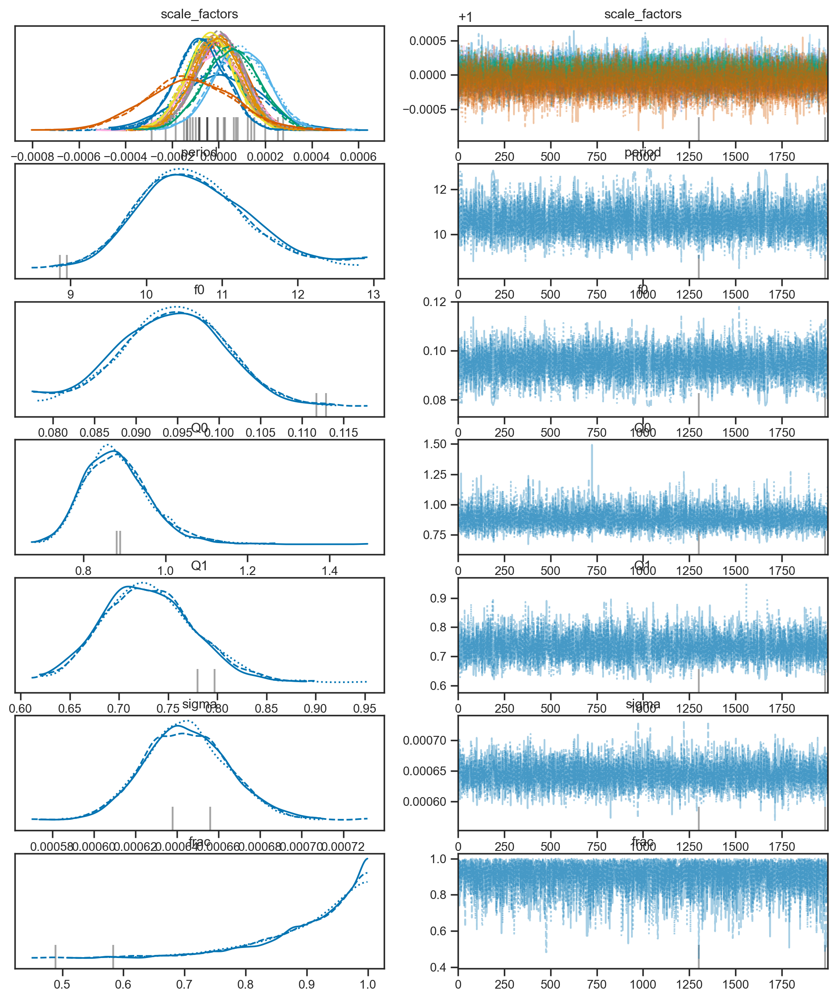

In [694]:
az.plot_trace(trace, var_names=['scale_factors', 'period', 'f0', 'Q0', 'Q1', 'sigma', 'frac'])

In [687]:
period_ls

18.33016932452524

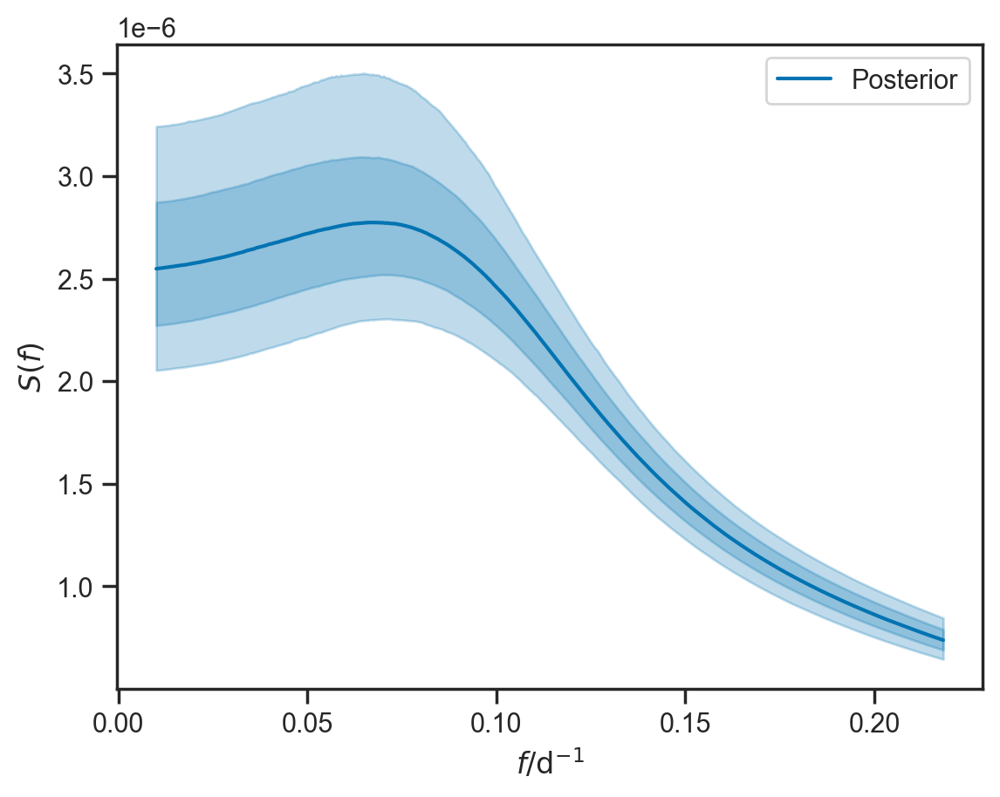

In [695]:
f = trace.posterior.frequencies.values.flatten()
l, = plt.plot(f, trace.posterior.psd.median(dim=('chain', 'draw')).values.flatten(), label='Posterior')
plt.fill_between(f, trace.posterior.psd.quantile(0.84, dim=('chain', 'draw')).values.flatten(), trace.posterior.psd.quantile(0.16, dim=('chain', 'draw')).values.flatten(), alpha=0.25, color=l.get_color())
plt.fill_between(f, trace.posterior.psd.quantile(0.975, dim=('chain', 'draw')).values.flatten(), trace.posterior.psd.quantile(0.025, dim=('chain', 'draw')).values.flatten(), alpha=0.25, color=l.get_color())
# plt.plot(f, np.ones_like(f)*(white_noise_variance/fny)*trace.posterior.err_scale.mean().values[()]**2, 'k', label='White Noise Level')
plt.xlabel(r'$f / \mathrm{d}^{-1}$')
plt.ylabel(r'$S(f)$')
plt.legend()

# plt.xlim(0,0.2)
# plt.ylim(0, 0.01)

# plt.axvline(1/10, color='k')

Text(0.5, 0, '$f / \\mathrm{d}^{-1}$')

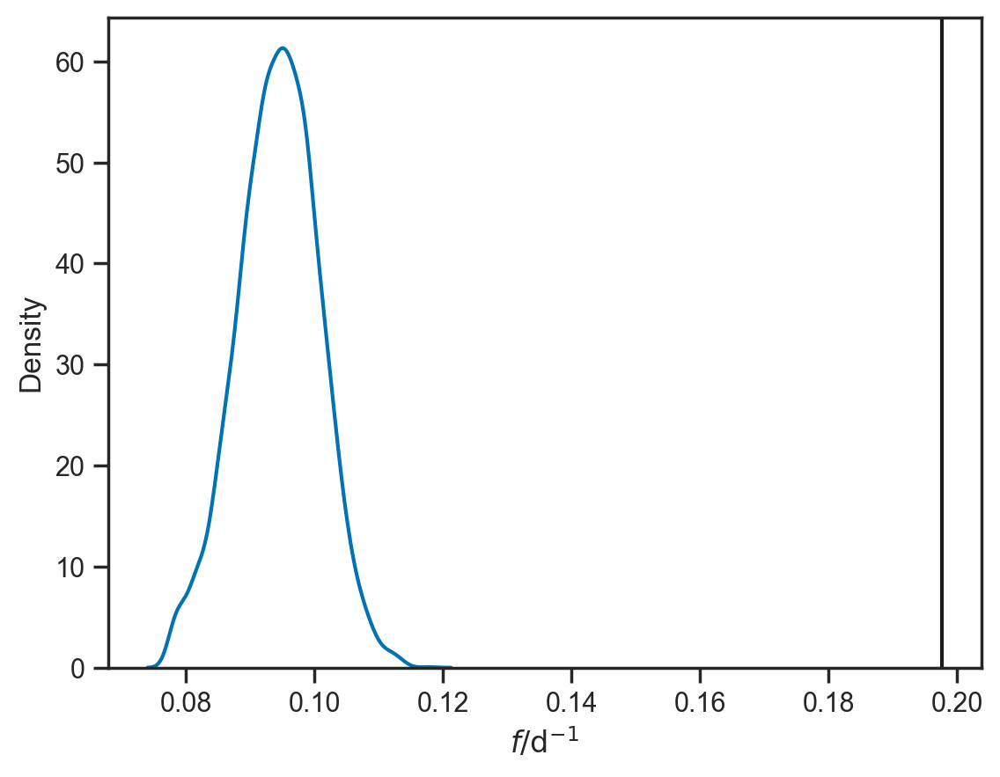

In [696]:
sns.kdeplot(trace.posterior['f0'].values.flatten())
plt.axvline(f_best_literature, color='k')
plt.xlabel(r'$f / \mathrm{d}^{-1}$')

In [697]:
trace_fbest_twice = trace.copy()

In [705]:
trace.sample_stats.lp.mean().values

array(39662.32210165)

In [699]:
trace_fbest.sample_stats.lp.mean(), trace_fbest_twice.sample_stats.lp.mean()

(<xarray.DataArray 'lp' ()> Size: 8B
 array(39654.53970192),
 <xarray.DataArray 'lp' ()> Size: 8B
 array(39662.32210165))

Text(0.5, 1.0, '$P = {10.579}^{+0.776}_{-0.643} \\, \\mathrm{d}$')

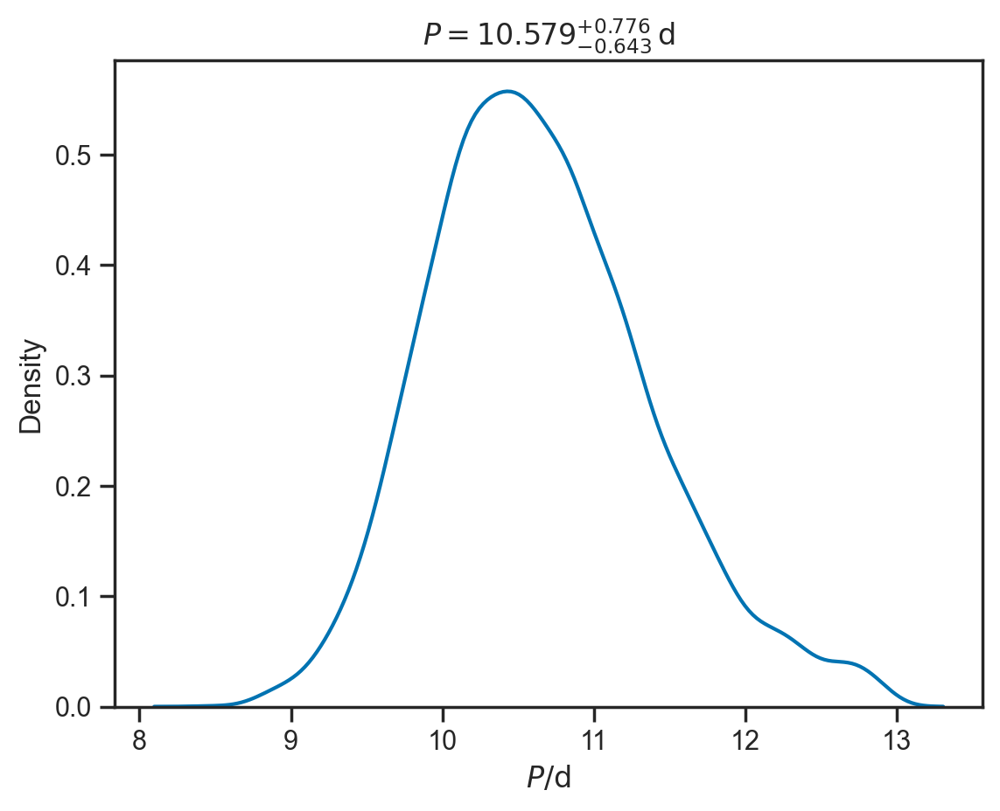

In [706]:
Ps = trace.posterior.period.values.flatten()
m, l, h = np.quantile(Ps, [0.5, 0.16, 0.84])


sns.kdeplot(Ps)
# plt.axvline(1/f_best_literature, color='k')
plt.xlabel(r'$P / \mathrm{d}$')
plt.title(r'$P = {{{:.3f}}}^{{+{:.3f}}}_{{-{:.3f}}} \, \mathrm{{d}}$'.format(m, h-m, m-l))

Text(0, 0.5, 'relative flux')

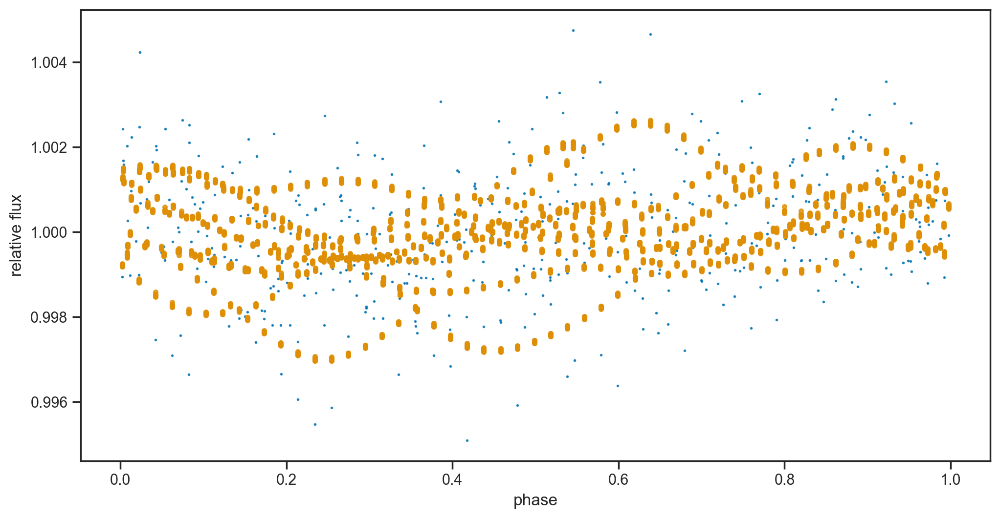

In [136]:
import random
plt.figure(figsize=(12,6))
# plt.errorbar(times, fluxes, yerr=flux_errs, fmt='.', alpha=0.1, color='k', markersize=2)
# plt.errorbar(times_[1700:2200]%(m)/(m), fluxes_[1700:2200], yerr=sigmas_[1700:2200], fmt='.', alpha=0.8, color='C0', markersize=2)
plt.plot(times_[1700:2200]%(m)/(m), fluxes_[1700:2200], '.', alpha=0.8, color='C0', markersize=2)
for i in range(10):
    idx_draw = random.randint(0, len(trace.posterior.draw) - 1)
    plt.plot(times_[1700:2200]%(m)/(m), trace.posterior['gp_mean_model'][0, idx_draw].values[1700:2200], '.', color="C1", alpha=0.8, zorder=10)
# plt.xlim(650,800)
# plt.xlim(0,1)
plt.xlabel('phase')
plt.ylabel('relative flux')

In [187]:
trace_previous = az.from_netcdf(f'kepler_analysis_results_chi2_santos/chains/KIC_{kepler_id}_trace.nc')

In [10]:
trace_previous.posterior.chain.values

array([0, 1, 2, 3])

Text(0, 0.5, 'relative flux')

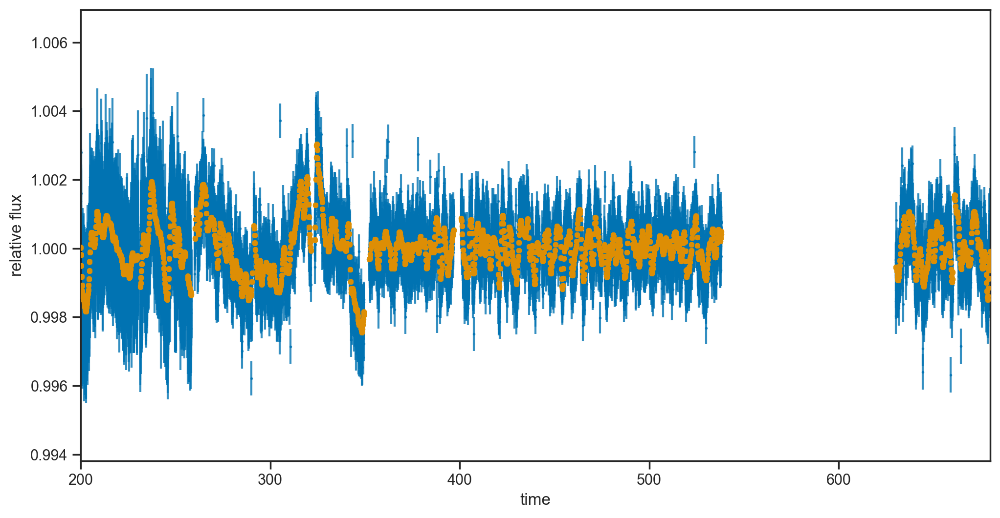

In [711]:
import random
plt.figure(figsize=(12,6))
# plt.errorbar(times, fluxes, yerr=flux_errs, fmt='.', alpha=0.1, color='k', markersize=2)
plt.errorbar(times, fluxes, yerr=flux_errs, fmt='.', alpha=0.8, color='C0', markersize=2)
for i in range(10):
    idx_draw = random.randint(0, len(trace.posterior.draw) - 1)
    plt.plot(times_, trace.posterior['gp_mean_model'][0, idx_draw].values, '.', color="C1", alpha=0.8, zorder=10)
plt.xlim(200,680)
# plt.xlim(0,1)
plt.xlabel('time')
plt.ylabel('relative flux')

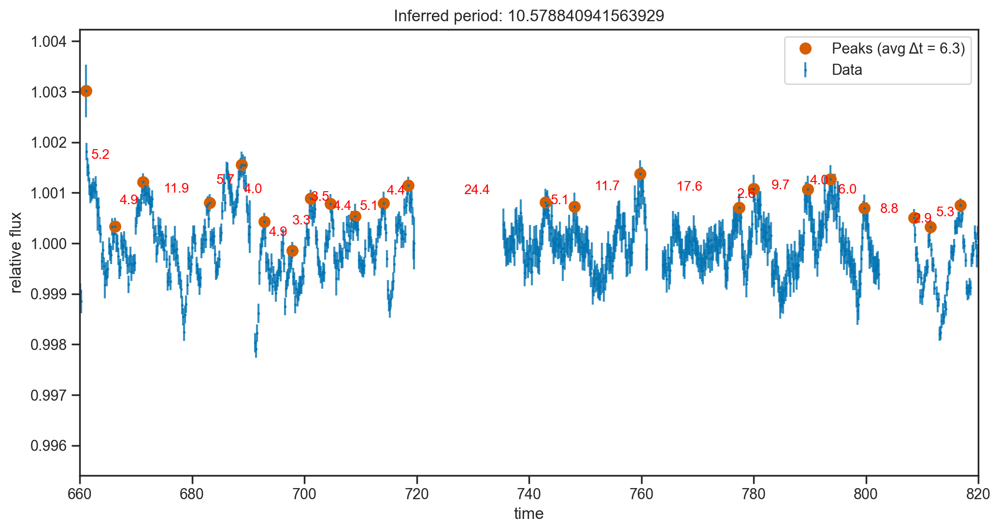

In [709]:
from scipy.signal import find_peaks

# Find peaks
peaks, _ = find_peaks(fluxes_, prominence=np.std(fluxes_) * 1.6)

# Calculate time differences, filtering out large gaps
time_diffs = np.diff(times_[peaks])
# Remove gaps larger than 2x the median difference (adjust threshold as needed)
median_diff = np.median(time_diffs)
time_diffs_filtered = time_diffs[time_diffs < 3 * median_diff]

# Plot
plt.figure(figsize=(12, 6))
plt.errorbar(times_, fluxes_, yerr=sigmas_, fmt='.', alpha=0.8, color='C0', markersize=2, label='Data')
plt.plot(times_[peaks], fluxes_[peaks], 'ro', markersize=8, label=f'Peaks (avg Δt = {np.mean(time_diffs_filtered):.1f})')

# Annotate time differences
for i in range(len(peaks) - 1):
    mid_time = (times_[peaks[i]] + times_[peaks[i+1]]) / 2
    mid_flux = (fluxes_[peaks[i]] + fluxes_[peaks[i+1]]) / 2
    plt.annotate(f'{time_diffs[i]:.1f}', xy=(mid_time, mid_flux), 
                ha='center', fontsize=10, color='red')

plt.xlim(660,820)
plt.xlabel('time')
plt.ylabel('relative flux')
plt.title(f"Inferred period: {m}")
plt.legend()
plt.show()

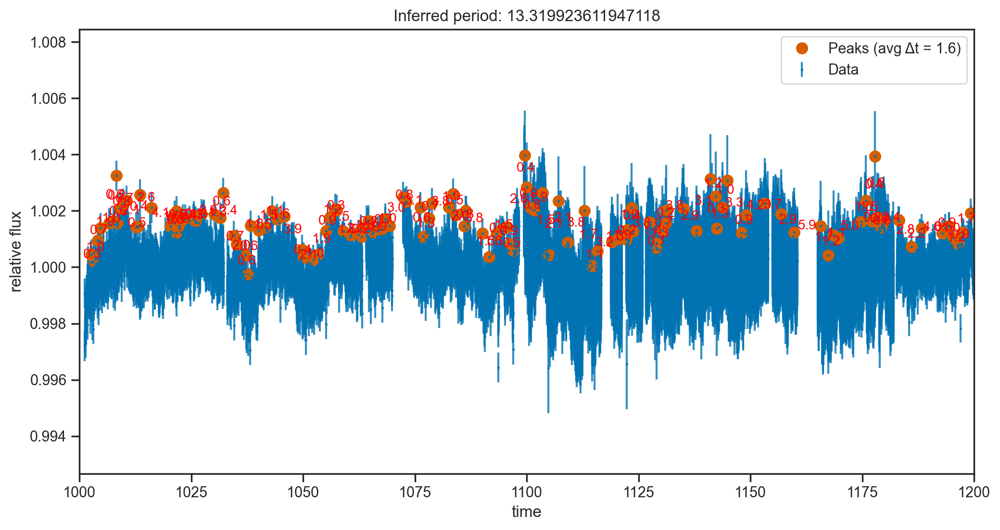

In [637]:
peaks, _ = find_peaks(fluxes, prominence=np.std(fluxes) * 2.6)

# Calculate time differences, filtering out large gaps
time_diffs = np.diff(times[peaks])
# Remove gaps larger than 2x the median difference (adjust threshold as needed)
median_diff = np.median(time_diffs)
time_diffs_filtered = time_diffs[time_diffs < 3 * median_diff]

# Plot
plt.figure(figsize=(12, 6))
plt.errorbar(times, fluxes, yerr=flux_errs, fmt='.', alpha=0.8, color='C0', markersize=2, label='Data')
plt.plot(times[peaks], fluxes[peaks], 'ro', markersize=8, label=f'Peaks (avg Δt = {np.mean(time_diffs_filtered):.1f})')

# Annotate time differences
for i in range(len(peaks) - 1):
    mid_time = (times[peaks[i]] + times[peaks[i+1]]) / 2
    mid_flux = (fluxes[peaks[i]] + fluxes[peaks[i+1]]) / 2
    plt.annotate(f'{time_diffs[i]:.1f}', xy=(mid_time, mid_flux), 
                ha='center', fontsize=10, color='red')

plt.xlim(1000,1200)
plt.xlabel('time')
plt.ylabel('relative flux')
plt.title(f"Inferred period: {m}")
plt.legend()
plt.show()

In [61]:
trace.sample_stats.lp.mean(), trace_previous.sample_stats.lp.mean(), trace_narrow.sample_stats.lp.mean()

(<xarray.DataArray 'lp' ()> Size: 8B
 array(56083.67775454),
 <xarray.DataArray 'lp' ()> Size: 8B
 array(56084.22500224),
 <xarray.DataArray 'lp' ()> Size: 8B
 array(56877.97952963))

<ErrorbarContainer object of 3 artists>

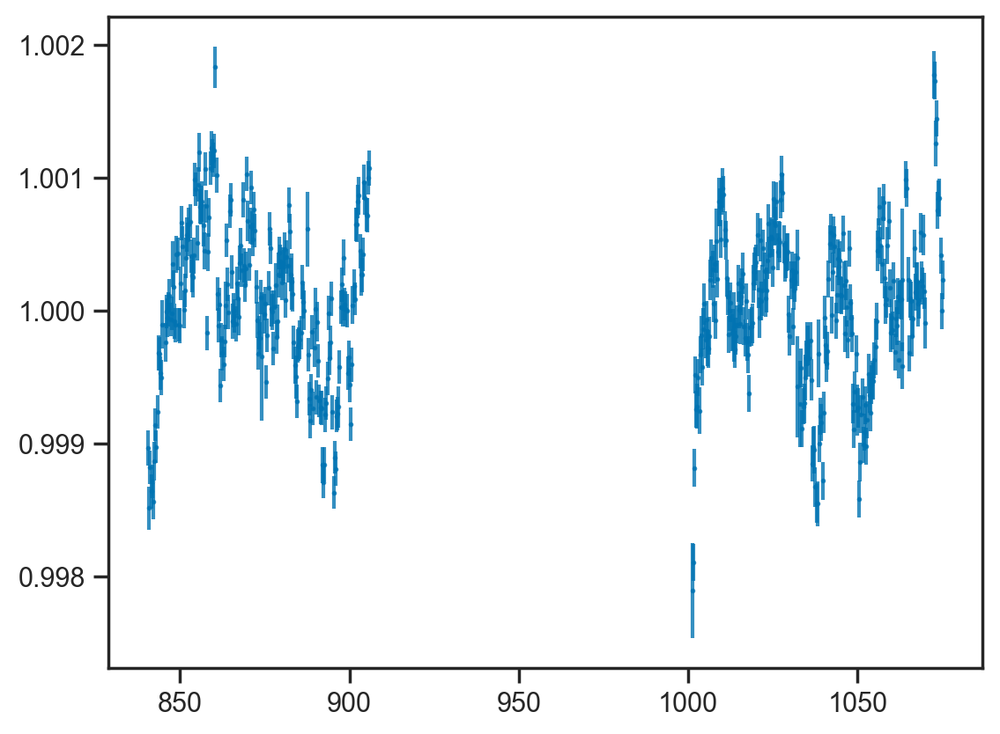

In [635]:
plt.errorbar(times_[1900:2350], fluxes_[1900:2350], yerr=sigmas_[1900:2350], fmt='.', alpha=0.8, color='C0', markersize=2)

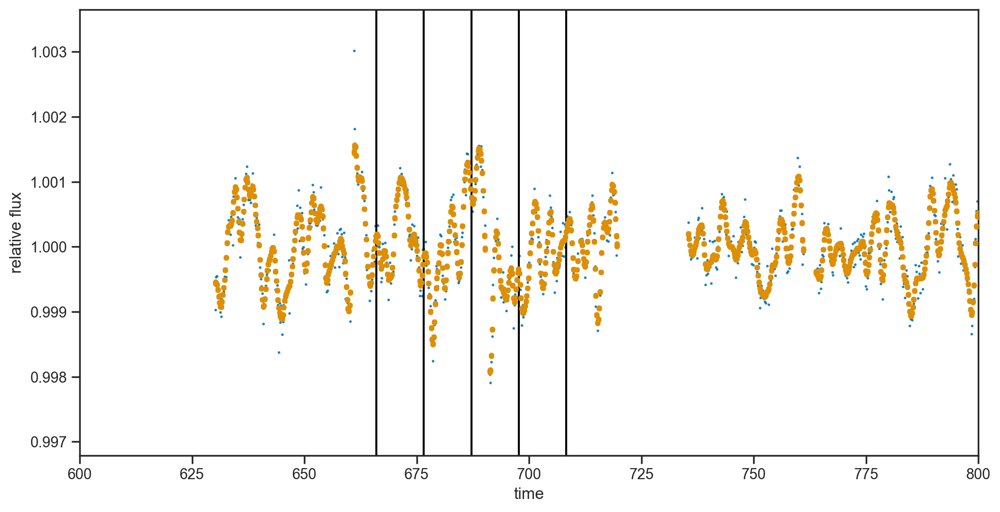

In [704]:
import random
plt.figure(figsize=(12,6))
# plt.errorbar(times, fluxes, yerr=flux_errs, fmt='.', alpha=0.1, color='k', markersize=2)
# plt.errorbar(times_[1700:2200], fluxes_[1700:2200], yerr=sigmas_[1700:2200], fmt='.', alpha=0.8, color='C0', markersize=2)
plt.plot(times_, fluxes_ ,'.', alpha=0.8, color='C0', markersize=2)
for i in range(10):
    idx_draw = random.randint(0, len(trace.posterior.draw) - 1)
    plt.plot(times_, trace.posterior['gp_mean_model'][0, idx_draw].values, '.', color="C1", alpha=0.8, zorder=10)
plt.xlim(600,800)
# plt.xlim(0,2)
plt.xlabel('time')
plt.ylabel('relative flux')
plt.axvline(666, color='black')
plt.axvline(666+m, color='black')
plt.axvline(666+m+m, color='black')
plt.axvline(666+m+m+m, color='black')
plt.axvline(666+m+m+m+m, color='black')

annotate time between peaks

Text(0, 0.5, 'relative flux')

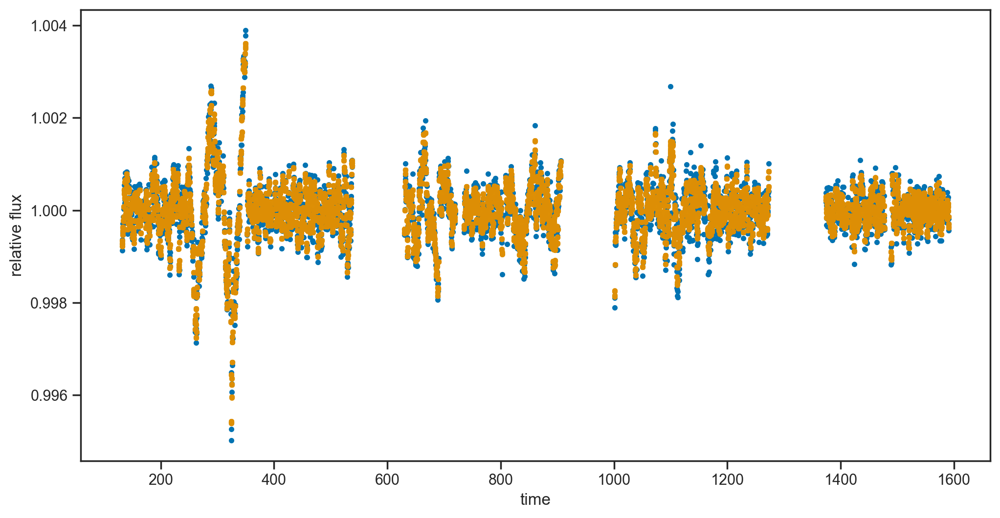

In [657]:
import random
plt.figure(figsize=(12,6))
# plt.errorbar(times, fluxes, yerr=flux_errs, fmt='.', alpha=0.1, color='k', markersize=2)
# plt.errorbar(times_, fluxes_, yerr=sigmas_, fmt='.', alpha=0.8, color='C0', markersize=2)
plt.plot(times_, fluxes_, '.')
for i in range(10):
    idx_draw = random.randint(0, len(trace.posterior.draw) - 1)
    plt.plot(times_, trace.posterior['gp_mean_model'][0, idx_draw].values, '.', color="C1", alpha=0.8, zorder=10)
# plt.xlim(650,800)
# plt.xlim(0,2)
plt.xlabel('time')
plt.ylabel('relative flux')

In [51]:
prominence_threshold

0.00027403088238627085

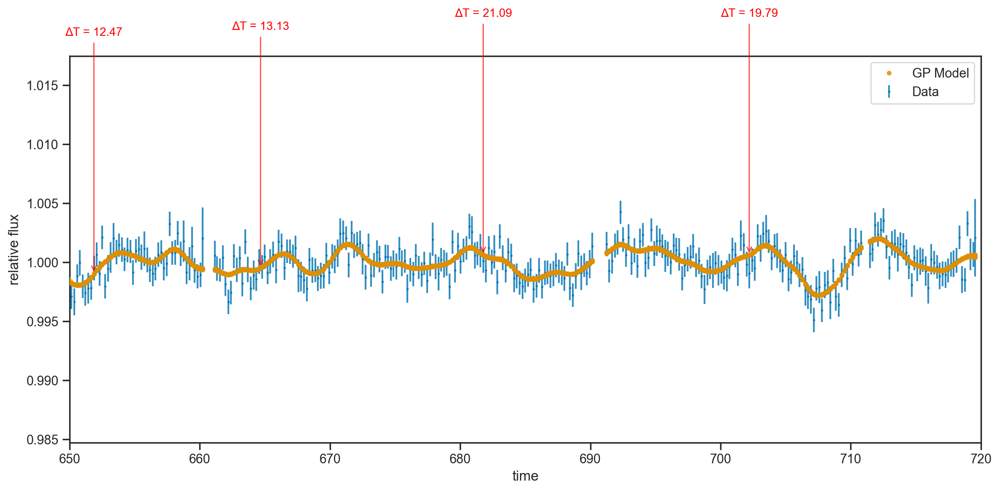

In [114]:
from scipy.signal import find_peaks

# Your existing plotting code
plt.figure(figsize=(12,6))
plt.errorbar(times_, fluxes_, yerr=sigmas_, fmt='.', alpha=0.8, color='C0', markersize=2, label='Data')

# Plot GP model samples
for i in range(10):
    idx_draw = random.randint(0, len(trace.posterior.draw) - 1)
    gp_model = trace.posterior['gp_mean_model'][0, idx_draw].values
    if i == 0:
        plt.plot(times_, gp_model, '.', color="C1", alpha=0.8, zorder=10, label='GP Model')
    else:
        plt.plot(times_, gp_model, '.', color="C1", alpha=0.8, zorder=10)

n_samples = len(trace.posterior.draw)
idx_sample = random.randint(0, n_samples - 1)
model_flux = trace.posterior['gp_mean_model'][0, idx_sample].values

flux_std = np.std(model_flux)
height_threshold = np.percentile(model_flux, 75)
prominence_threshold = 0.5 * flux_std

peaks, properties = find_peaks(
    model_flux, 
    height=height_threshold,
    prominence=prominence_threshold,
    distance=len(times_)//100  
)

peak_times = times_[peaks]
peak_fluxes = fluxes_[peaks]

periods = np.diff(peak_times)
    
# Annotate each period
for i, period in enumerate(periods):
    mid_time = (peak_times[i] + peak_times[i+1]) / 2
    mid_flux = np.interp(mid_time, times_, gp_model)
    
    # Offset annotation above the curve
    plt.annotate(f'ΔT = {period:.2f}', 
                xy=(mid_time, mid_flux), 
                xytext=(mid_time, mid_flux + 0.02),
                ha='center', va='bottom',
                fontsize=10, color='red',
                arrowprops=dict(arrowstyle='->', color='red', alpha=0.7))
    
    # Draw a line connecting the peaks for clarity
    # plt.plot([peak_times[i], peak_times[i+1]], 
    #         [peak_fluxes[i], peak_fluxes[i+1]], 
    #         'r--', alpha=0.5, linewidth=1)

plt.xlim(650, 720)
plt.xlabel('time')
plt.ylabel('relative flux')
plt.legend()
plt.tight_layout()

Text(0.5, 0, 'Q1')

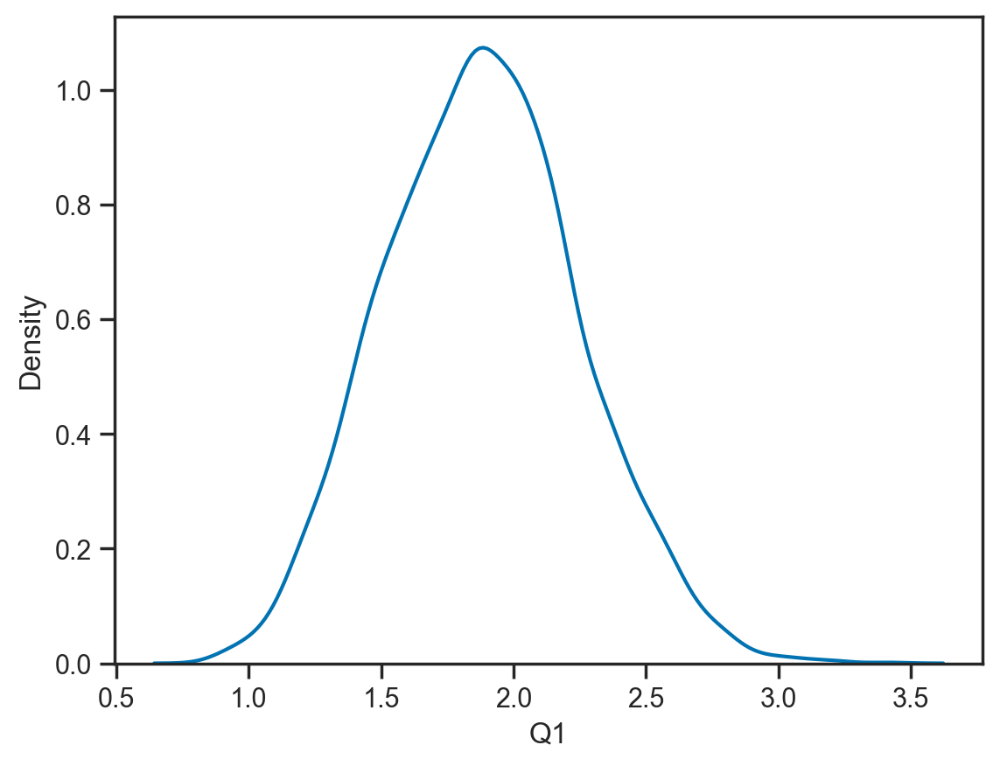

In [45]:
# sns.kdeplot(trace.posterior.Q0.values.flatten())
sns.kdeplot(trace.posterior.Q1.values.flatten())
plt.xlabel('Q1')

(-0.5, 1.5)

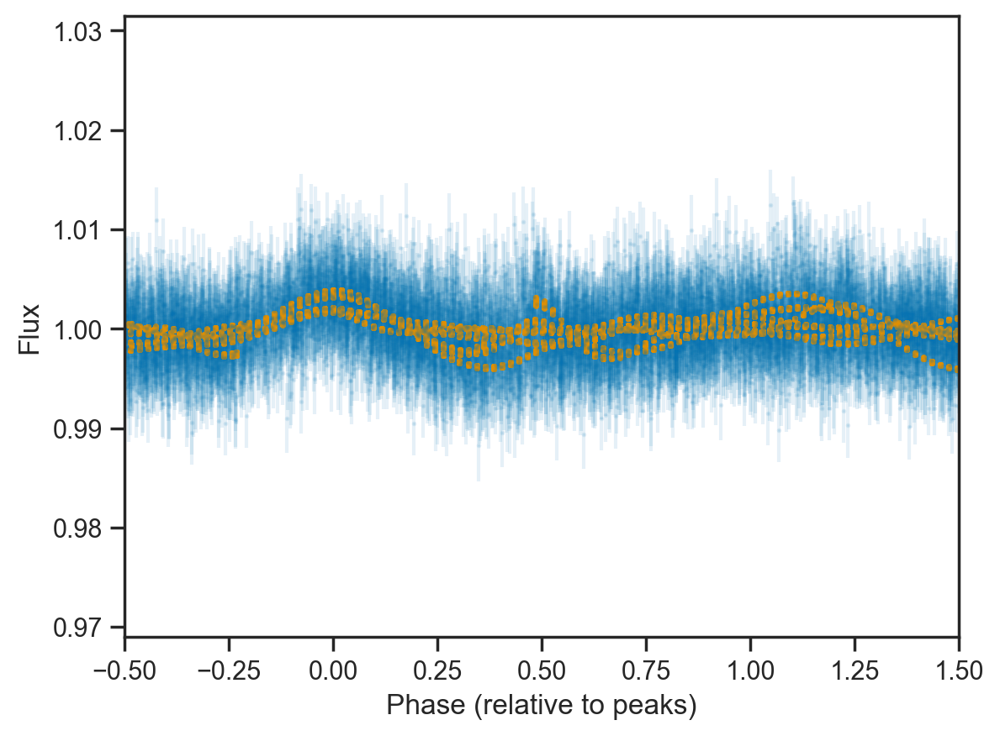

In [115]:
from scipy.signal import find_peaks
n_samples = len(trace.posterior.draw)
idx_sample = random.randint(0, n_samples - 1)
model_flux = trace.posterior['gp_mean_model'][0, idx_sample].values

flux_std = np.std(model_flux)
height_threshold = np.percentile(model_flux, 75)
prominence_threshold = 0.5 * flux_std

peaks, properties = find_peaks(
    model_flux, 
    height=height_threshold,
    prominence=prominence_threshold,
    distance=len(times)//100  
)

peak_times = times_[peaks]
peak_fluxes = model_flux[peaks]

all_phases = []
all_fluxes = []
all_errs = []

for peak_time in peak_times:
    phases = (times - peak_time) / m
    
    # mask = (phases >= phase_range[0]) & (phases <= phase_range[1])
    
    all_phases.extend(phases)
    all_fluxes.extend(fluxes)
    all_errs.extend(flux_errs)

folded_phases, folded_fluxes, folded_errs = np.array(all_phases), np.array(all_fluxes), np.array(all_errs)

plt.errorbar(folded_phases, folded_fluxes, yerr=folded_errs, 
                fmt='.', alpha=0.1, color='C0', markersize=2, 
                label=f'Folded data')
    
# Plot folded model samples
for i in range(1000):
    idx_draw = random.randint(0, len(trace.posterior.draw) - 1)
    model_flux = trace.posterior['gp_mean_model'][0, idx_draw].values
    
    model_phases = []
    model_folded = []
    model_errs = []

    for peak_time in peak_times:
        phases = (times_ - peak_time) / m
        
        model_phases.extend(phases)
        model_folded.extend(model_flux)
        model_errs.extend(flux_errs)

    model_phases, model_folded, model_errs = np.array(model_phases), np.array(model_folded), np.array(model_errs)
    
    sort_idx = np.argsort(model_phases)
    plt.plot(model_phases[sort_idx], model_folded[sort_idx], 
            '.', color="C1", alpha=1.0, markersize=3)

plt.xlabel('Phase (relative to peaks)')
plt.ylabel('Flux')
plt.xlim(-0.5, 1.5)

In [58]:
model_half = harmonic_sho_model(times_, fluxes_, sigmas_, binned_quarters, f_best/2, 0.1, psd_freq=frequencies, predict_flux=True)

In [59]:
trace_half = pm.sample(tune=5000, draws=5000, cores=4, chains=2, model=model_half, progressbar=True, init='adapt_full')

Auto-assigning NUTS sampler...
Initializing NUTS using adapt_full...
/Users/sabina/miniconda3/envs/jax-env/lib/python3.12/site-packages/pymc/step_methods/hmc/quadpotential.py:754: UserWarning: QuadPotentialFullAdapt is an experimental feature
  warnings.warn("QuadPotentialFullAdapt is an experimental feature")
Multiprocess sampling (2 chains in 2 jobs)
NUTS: [log_scale_factors_scaled, log_err_scale, log_period_scaled, sigma_scaled, frac, dQ1, dQb]


Output()

Sampling 2 chains for 5_000 tune and 5_000 draw iterations (10_000 + 10_000 draws total) took 63 seconds.
There were 3 divergences after tuning. Increase `target_accept` or reparameterize.
We recommend running at least 4 chains for robust computation of convergence diagnostics


In [60]:
az.rhat(trace_half).period.values

array(1.00093102)

In [61]:
trace_half = trace_half.sel(chain=[get_best_chain(trace_half)[0]])

array([[<Axes: title={'center': 'scale_factors'}>,
        <Axes: title={'center': 'scale_factors'}>],
       [<Axes: title={'center': 'period'}>,
        <Axes: title={'center': 'period'}>],
       [<Axes: title={'center': 'f0'}>, <Axes: title={'center': 'f0'}>],
       [<Axes: title={'center': 'Q0'}>, <Axes: title={'center': 'Q0'}>],
       [<Axes: title={'center': 'Q1'}>, <Axes: title={'center': 'Q1'}>],
       [<Axes: title={'center': 'sigma'}>,
        <Axes: title={'center': 'sigma'}>],
       [<Axes: title={'center': 'frac'}>,
        <Axes: title={'center': 'frac'}>],
       [<Axes: title={'center': 'err_scale'}>,
        <Axes: title={'center': 'err_scale'}>]], dtype=object)

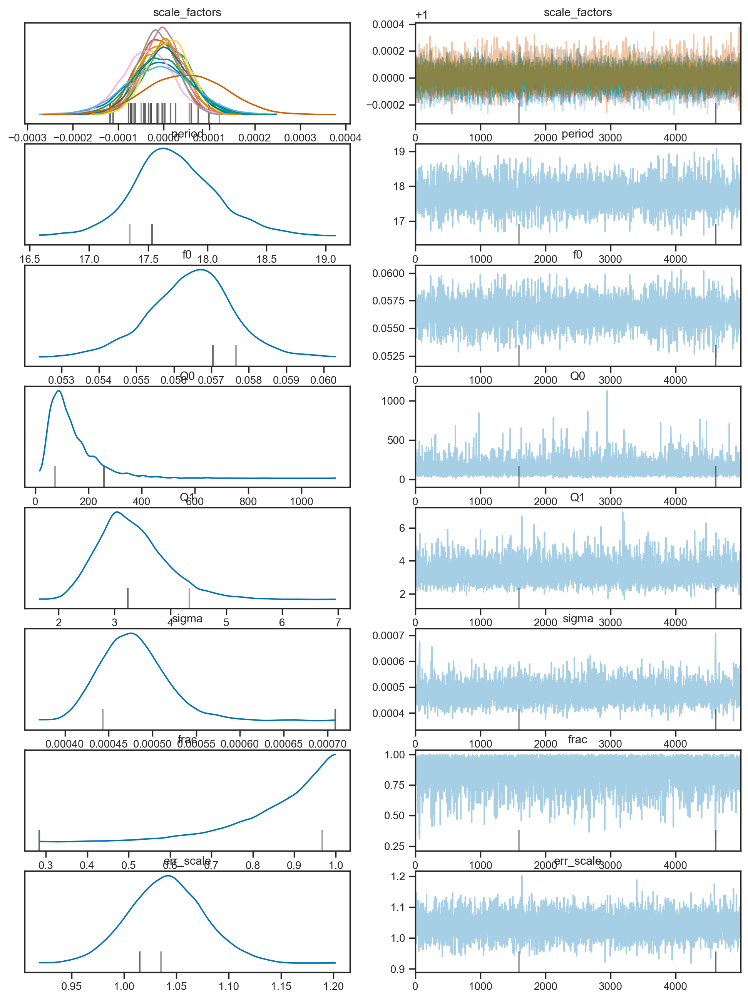

In [62]:
az.plot_trace(trace_half, var_names=['scale_factors', 'period', 'f0', 'Q0', 'Q1', 'sigma', 'frac', 'err_scale'])

Text(0.5, 1.0, '$P = {17.699}^{+0.363}_{-0.293} \\, \\mathrm{d}$')

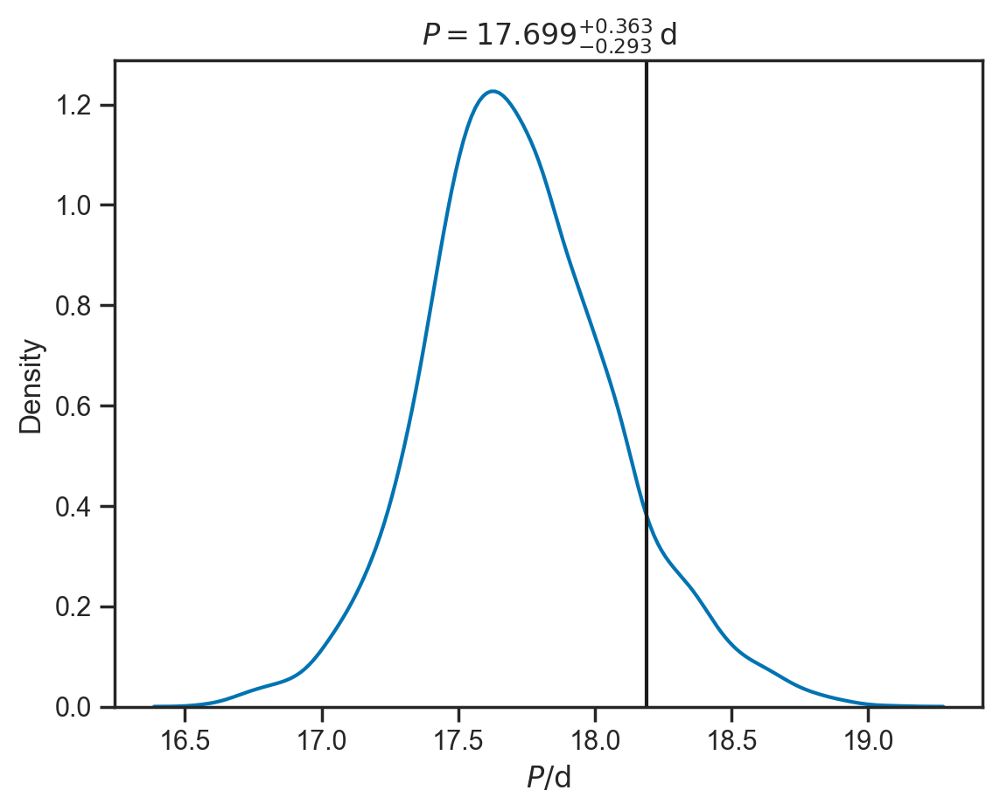

In [63]:
Ps = trace_half.posterior.period.values.flatten()
m, l, h = np.quantile(Ps, [0.5, 0.16, 0.84])


sns.kdeplot(Ps)
plt.axvline(1/f_best_literature, color='k')
plt.xlabel(r'$P / \mathrm{d}$')
plt.title(r'$P = {{{:.3f}}}^{{+{:.3f}}}_{{-{:.3f}}} \, \mathrm{{d}}$'.format(m, h-m, m-l))

(650.0, 700.0)

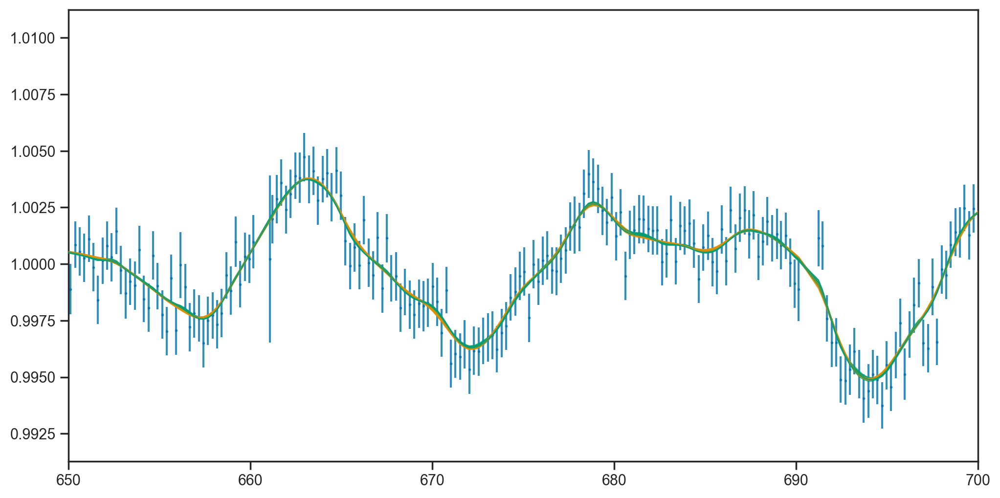

In [343]:
chain_fromfile_best = az.from_netcdf('kepler_analysis_results_chi2_2/chains/KIC_5024182_trace_best.nc')
chain_fromfile_half = az.from_netcdf('kepler_analysis_results_chi2_2/chains/KIC_5024182_trace_half.nc')
import random
plt.figure(figsize=(12,6))
# plt.errorbar(times, fluxes, yerr=flux_errs, fmt='.', alpha=0.1, color='k', markersize=2)
plt.errorbar(times_, fluxes_, yerr=sigmas_, fmt='.', alpha=0.8, color='C0', markersize=2)
for i in range(10):
    idx_draw = random.randint(0, len(chain_fromfile_best.posterior.draw) - 1)
    if 'gp_mean_model' in chain_fromfile_best.posterior:
        # mean_model = chain_fromfile.posterior['gp_mean_model'][0, idx_draw].values
        plt.plot(times_, chain_fromfile_best.posterior['gp_mean_model'][0, idx_draw].values, color="C1", lw=1, alpha=0.8, zorder=10)
        plt.plot(times_, chain_fromfile_half.posterior['gp_mean_model'][0, idx_draw].values, color="C2", lw=1, alpha=0.8, zorder=10)
plt.xlim(650,700)

/var/folders/6b/q0ls5s7570d8s04fbvw5gmxw0000gn/T/ipykernel_51193/1222931813.py:17: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


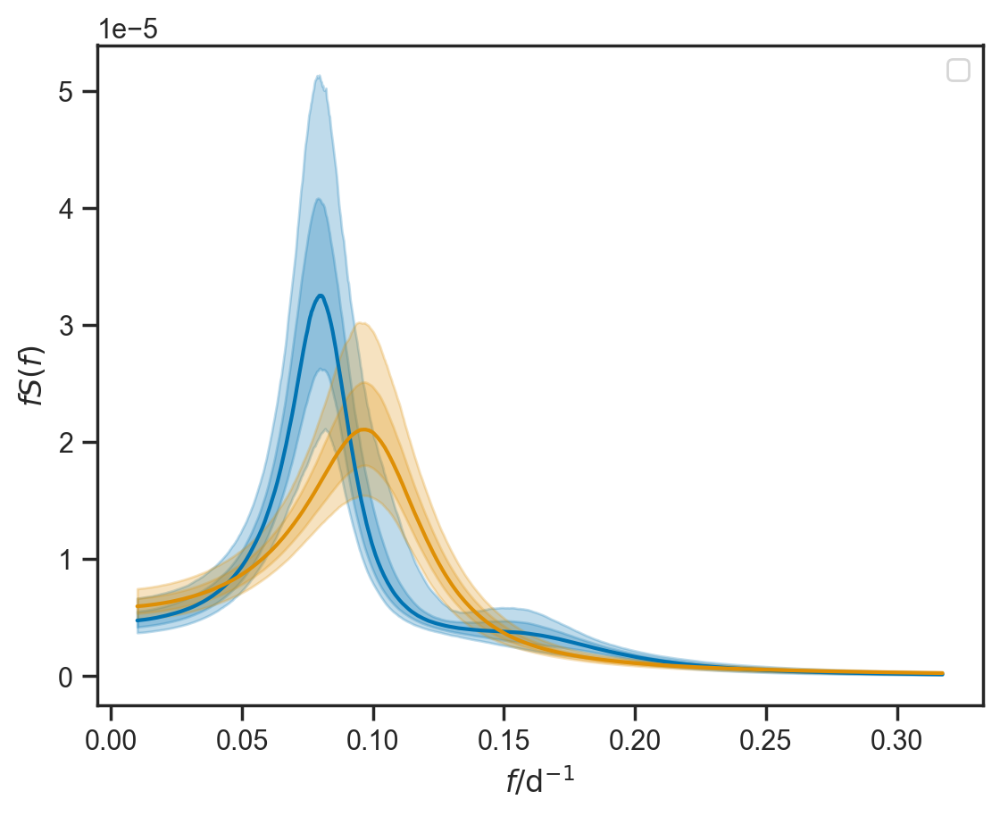

In [346]:
trace=az.from_netcdf('kepler_analysis_results_chi2_2/chains/KIC_5024182_trace_best.nc')
f = trace.posterior.frequencies.values.flatten()
l, = plt.plot(f, trace.posterior.psd.median(dim=('chain', 'draw')).values.flatten())
plt.fill_between(f, trace.posterior.psd.quantile(0.84, dim=('chain', 'draw')).values.flatten(), trace.posterior.psd.quantile(0.16, dim=('chain', 'draw')).values.flatten(), alpha=0.25, color=l.get_color())
plt.fill_between(f, trace.posterior.psd.quantile(0.975, dim=('chain', 'draw')).values.flatten(), trace.posterior.psd.quantile(0.025, dim=('chain', 'draw')).values.flatten(), alpha=0.25, color=l.get_color())

trace=az.from_netcdf('kepler_analysis_results_chi2_2/chains/KIC_5024182_trace_half.nc')
f = trace.posterior.frequencies.values.flatten()
l, = plt.plot(f, trace.posterior.psd.median(dim=('chain', 'draw')).values.flatten())
plt.fill_between(f, trace.posterior.psd.quantile(0.84, dim=('chain', 'draw')).values.flatten(), trace.posterior.psd.quantile(0.16, dim=('chain', 'draw')).values.flatten(), alpha=0.25, color=l.get_color())
plt.fill_between(f, trace.posterior.psd.quantile(0.975, dim=('chain', 'draw')).values.flatten(), trace.posterior.psd.quantile(0.025, dim=('chain', 'draw')).values.flatten(), alpha=0.25, color=l.get_color())

# plt.axvline(1/10, color='k', label='10 days')
# plt.axvline(1/5.4,color='red', label='lit value')
plt.xlabel(r'$f / \mathrm{d}^{-1}$')
plt.ylabel(r'$f S(f)$')
plt.legend()
# plt.legend(['10 days'])

# plt.ylim(0,3e-6)

/var/folders/6b/q0ls5s7570d8s04fbvw5gmxw0000gn/T/ipykernel_51193/93520648.py:9: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


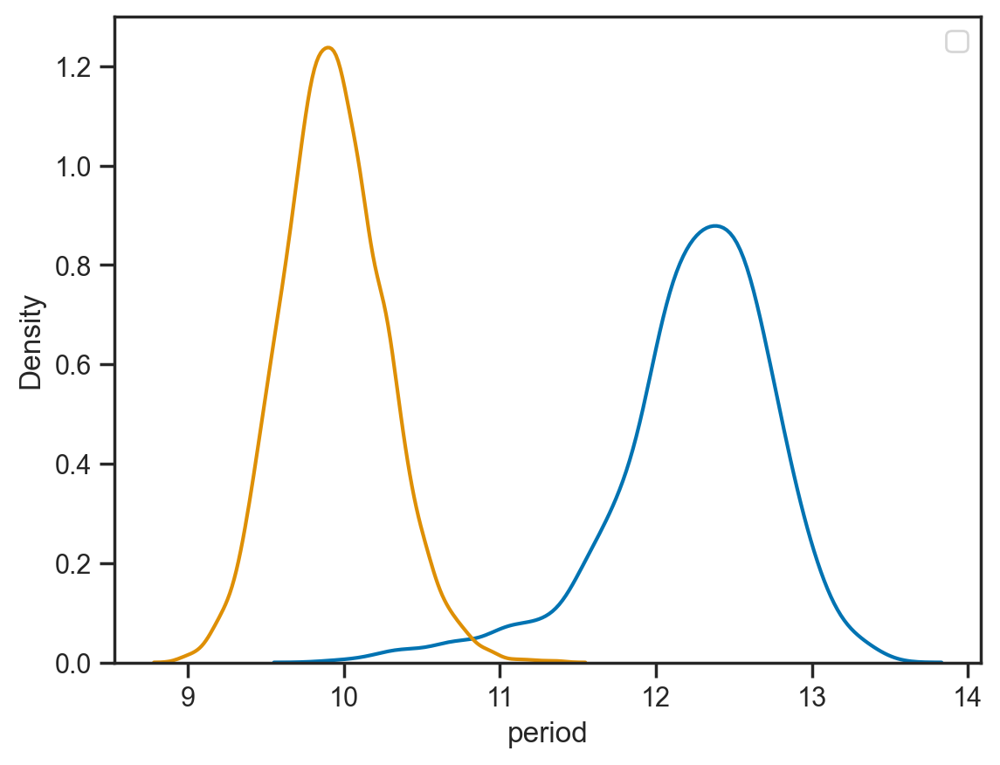

In [348]:
trace=az.from_netcdf('kepler_analysis_results_chi2_2/chains/KIC_5024182_trace_best.nc')
sns.kdeplot(trace.posterior.period.values.flatten())

trace=az.from_netcdf('kepler_analysis_results_chi2_2/chains/KIC_5024182_trace_half.nc')
sns.kdeplot(trace.posterior.period.values.flatten())


plt.xlabel('period')
plt.legend()

AttributeError: Line2D.set() got an unexpected keyword argument 'fmt'

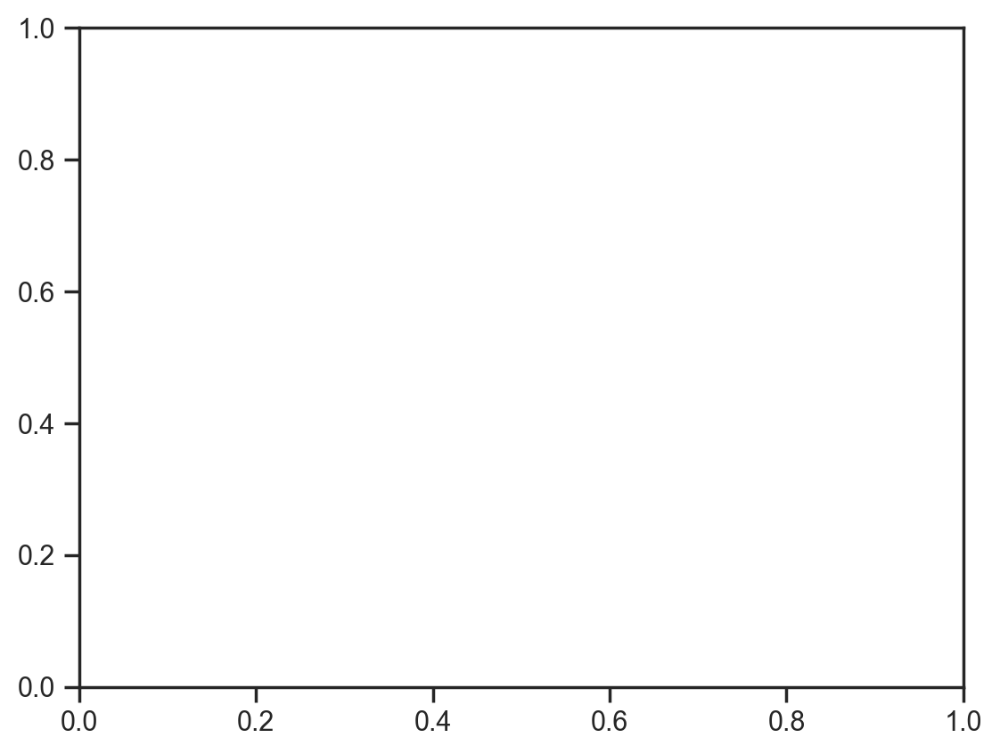

In [187]:
plt.plot(times_%20, mean_model, color="C1", alpha=0.8, zorder=10, fmt='.')

In [137]:
def plot_windowed_phase_folding(kepler_id, times, fluxes, flux_errs, period, window_size_days=30):
    fig, axes = plt.subplots(figsize=(14, 10), nrows=2, ncols=1)
    
    # Plot full light curve in top panel
    axes[0].errorbar(times, fluxes, yerr=flux_errs, fmt='.', alpha=0.3, color='k', markersize=2)
    axes[0].set_xlabel('Time (days)')
    axes[0].set_ylabel('Relative Flux')
    axes[0].set_title(f'KIC {kepler_id} Full Light Curve')
    
    # Split data into windows
    start_time = times[0]
    end_time = times[-1]
    window_start_times = np.arange(start_time, end_time, window_size_days)
    
    # Use a different color for each window's phase-folded data
    colors = plt.cm.viridis(np.linspace(0, 1, len(window_start_times)))
    
    # Bottom panel for phase-folded data
    for i, t_start in enumerate(window_start_times):
        # Select data in this time window
        t_end = t_start + window_size_days
        mask = (times >= t_start) & (times < t_end)
        
            
        window_times = times[mask]
        window_fluxes = fluxes[mask]
        window_flux_errs = flux_errs[mask]
        
        # Phase fold just this window of data
        phases, phase_fluxes, phase_flux_errs = phase_fold_data(window_times, window_fluxes, 
                                                             window_flux_errs, period)
        
        # Plot with color indicating the time window
        axes[1].errorbar(phases, phase_fluxes, yerr=phase_flux_errs, 
                      fmt='.', alpha=0.5, color=colors[i], markersize=3)
    
    # Customize phase plot
    axes[1].set_xlabel('Phase')
    axes[1].set_ylabel('Relative Flux')
    axes[1].set_title(f'Phase-folded Light Curve by Time Window\nPeriod: {period:.3f} days')
    axes[1].set_xlim(0, 1)
    
    # Add colorbar to show time progression
    sm = plt.cm.ScalarMappable(cmap=plt.cm.viridis, 
                             norm=plt.Normalize(vmin=start_time, vmax=end_time))
    cbar = fig.colorbar(sm, ax=axes[1])
    cbar.set_label('Time (days)')
    
    plt.tight_layout()
    return fig

In [138]:
def phase_fold_data(times, fluxes, flux_errs, period):
    """Phase fold the time series data using the given period."""
    phases = (times % period) #/ period
    # Sort by phase
    sort_idx = np.argsort(phases)
    return phases[sort_idx], fluxes[sort_idx], flux_errs[sort_idx]

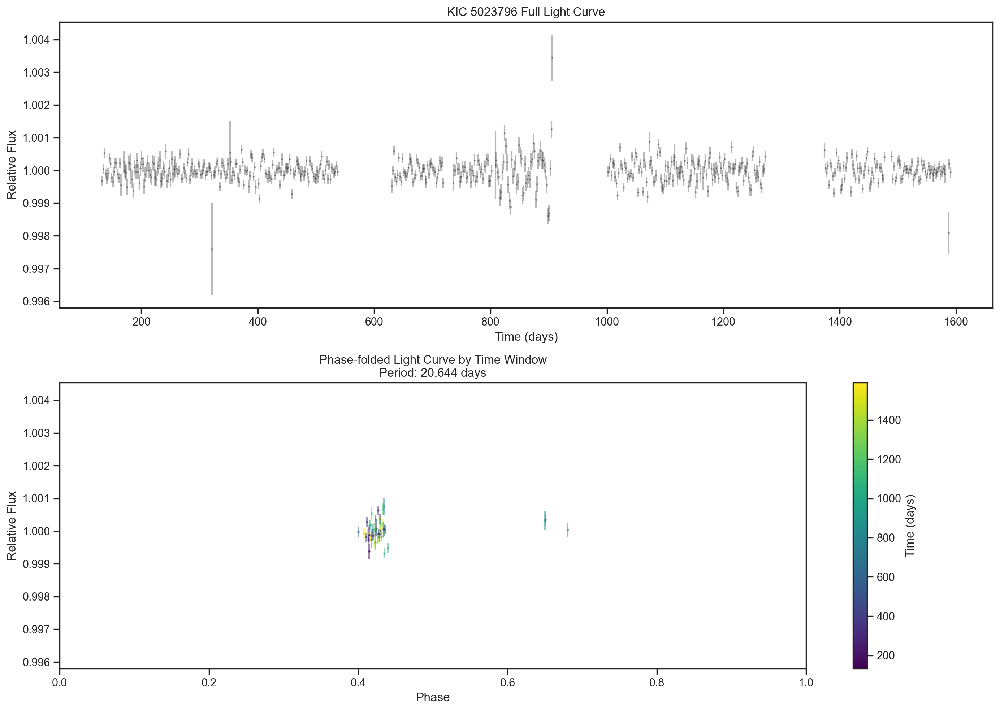

In [145]:
fig = plot_windowed_phase_folding(kepler_id, times_, fluxes_, sigmas_,period_ls, window_size_days=20)

Initial period guess: 11.579470 days
Optimized period: 11.582380 days
Difference: 251.37 seconds


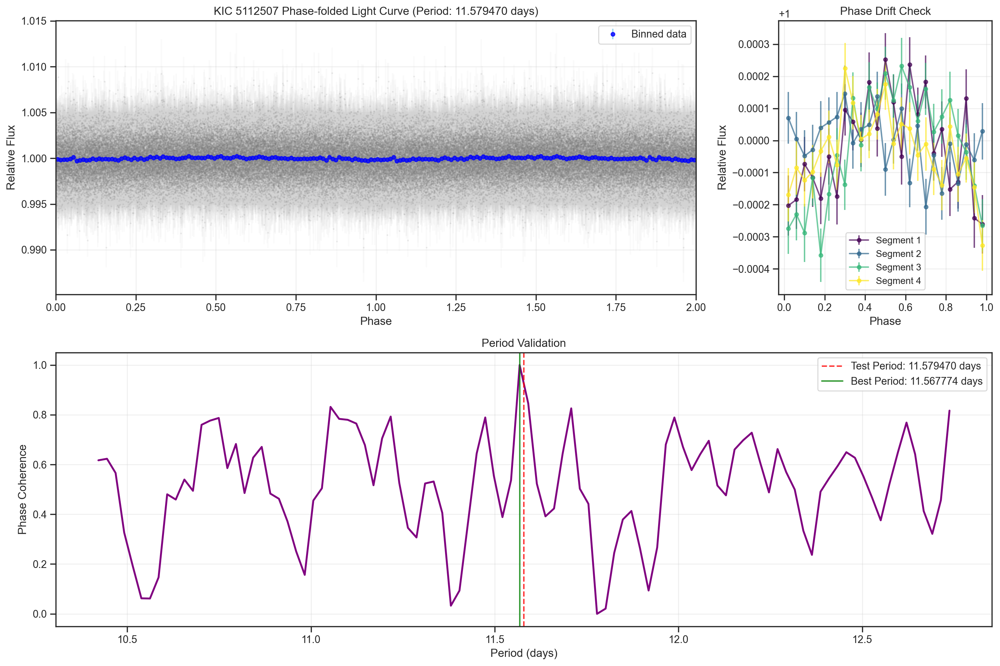

In [115]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.gridspec import GridSpec
from scipy.signal import savgol_filter

def phase_fold_data(times, fluxes, flux_errs, period, t0=None):
    """
    Phase fold the data using the provided period.
    
    Parameters:
    -----------
    times : array-like
        The time values
    fluxes : array-like
        The flux values
    flux_errs : array-like
        The flux error values
    period : float
        The period to fold with
    t0 : float, optional
        Reference time for phase=0. If None, min(times) is used.
        
    Returns:
    --------
    phases : array-like
        The phase values (0 to 1)
    folded_fluxes : array-like
        The corresponding flux values
    folded_flux_errs : array-like
        The corresponding flux error values
    """
    if t0 is None:
        t0 = np.min(times)
    
    phases = ((times - t0) / period) % 1.0
    
    # Sort by phase
    sort_idx = np.argsort(phases)
    phases = phases[sort_idx]
    folded_fluxes = fluxes[sort_idx]
    folded_flux_errs = flux_errs[sort_idx]
    
    return phases, folded_fluxes, folded_flux_errs

def bin_phase_folded_data(phases, fluxes, flux_errs, nbins=100):
    """
    Bin phase-folded data.
    
    Parameters:
    -----------
    phases : array-like
        Phase values (0 to 1)
    fluxes : array-like
        Flux values
    flux_errs : array-like
        Flux error values
    nbins : int
        Number of bins
        
    Returns:
    --------
    bin_phases : array-like
        The central phase value for each bin
    bin_fluxes : array-like
        The mean flux value for each bin
    bin_flux_errs : array-like
        The error on the mean flux for each bin
    """
    bins = np.linspace(0, 1, nbins + 1)
    bin_indices = np.digitize(phases, bins) - 1
    
    bin_phases = []
    bin_fluxes = []
    bin_flux_errs = []
    
    for i in range(nbins):
        mask = bin_indices == i
        if np.sum(mask) > 0:
            bin_phases.append(np.mean(phases[mask]))
            bin_fluxes.append(np.mean(fluxes[mask]))
            # Error on the mean = std / sqrt(N)
            if np.sum(mask) > 1:
                bin_flux_errs.append(np.std(fluxes[mask]) / np.sqrt(np.sum(mask)))
            else:
                bin_flux_errs.append(flux_errs[mask][0])
    
    return np.array(bin_phases), np.array(bin_fluxes), np.array(bin_flux_errs)

def plot_phase_validation(kepler_id, times, fluxes, flux_errs, period, t0=None, nbins=100, 
                          n_segments=4, smooth_window=None, model_flux=None):
    """
    Create a comprehensive phase folding plot to validate periodicity and check for phase drift.
    
    Parameters:
    -----------
    kepler_id : str or int
        The Kepler ID for the title
    times : array-like
        The time values
    fluxes : array-like
        The flux values
    flux_errs : array-like
        The flux error values
    period : float
        The period to fold with
    t0 : float, optional
        Reference time for phase=0. If None, min(times) is used
    nbins : int
        Number of bins for phase-folded data
    n_segments : int
        Number of time segments to divide the data into
    smooth_window : int, optional
        Window size for Savitzky-Golay smoothing of binned data
    model_flux : array-like, optional
        Model flux values to overlay (must match times array)
        
    Returns:
    --------
    fig : matplotlib.figure.Figure
        The figure object
    """
    if t0 is None:
        t0 = np.min(times)
    
    # Create the figure with gridspec
    fig = plt.figure(figsize=(15, 10))
    gs = GridSpec(2, 2, height_ratios=[1, 1], width_ratios=[3, 1], figure=fig)
    
    # Full phase folded light curve (top left)
    ax1 = fig.add_subplot(gs[0, 0])
    phases, phase_fluxes, phase_flux_errs = phase_fold_data(times, fluxes, flux_errs, period, t0)
    
    # Plot the raw phase folded data (light gray)
    ax1.errorbar(phases, phase_fluxes, yerr=phase_flux_errs, fmt='.', alpha=0.1, 
                 color='gray', ecolor='lightgray', markersize=2)
    
    # Plot the binned data
    bin_phases, bin_fluxes, bin_flux_errs = bin_phase_folded_data(phases, phase_fluxes, phase_flux_errs, nbins)
    ax1.errorbar(bin_phases, bin_fluxes, yerr=bin_flux_errs, fmt='o', color='blue', 
                 markersize=4, ecolor='skyblue', alpha=0.8, label='Binned data')
    
    # Apply smoothing if requested
    if smooth_window is not None and len(bin_phases) > smooth_window:
        # Sort by phase to ensure continuity for smoothing
        sort_idx = np.argsort(bin_phases)
        sorted_phases = bin_phases[sort_idx]
        sorted_fluxes = bin_fluxes[sort_idx]
        
        # Apply Savitzky-Golay filter
        smooth_fluxes = savgol_filter(sorted_fluxes, min(smooth_window, len(sorted_fluxes) // 2 * 2 + 1), 3)
        ax1.plot(sorted_phases, smooth_fluxes, '-', color='red', lw=2, alpha=0.8, label='Smoothed trend')
    
    # Add model if provided
    if model_flux is not None:
        model_phases, model_fluxes, _ = phase_fold_data(times, model_flux, np.ones_like(model_flux), period, t0)
        ax1.scatter(model_phases, model_fluxes, color="C1", s=10, alpha=0.5, label="Model")
    
    # Repeat for phase > 1 for continuity
    ax1.errorbar(phases + 1, phase_fluxes, yerr=phase_flux_errs, fmt='.', alpha=0.1,
                 color='gray', ecolor='lightgray', markersize=2)
    ax1.errorbar(bin_phases + 1, bin_fluxes, yerr=bin_flux_errs, fmt='o', color='blue',
                 markersize=4, ecolor='skyblue', alpha=0.8)
    
    if smooth_window is not None and len(bin_phases) > smooth_window:
        ax1.plot(sorted_phases + 1, smooth_fluxes, '-', color='red', lw=2, alpha=0.8)
    
    if model_flux is not None:
        ax1.scatter(model_phases + 1, model_fluxes, color="C1", s=10, alpha=0.5)
    
    ax1.set_xlabel('Phase')
    ax1.set_ylabel('Relative Flux')
    ax1.set_title(f'KIC {kepler_id} Phase-folded Light Curve (Period: {period:.6f} days)')
    ax1.set_xlim(0, 2)
    ax1.legend(loc='best')
    ax1.grid(True, alpha=0.3)
    
    # Phase drift visualization (top right)
    ax2 = fig.add_subplot(gs[0, 1])
    
    # Divide the data into segments to check for phase drift
    time_segments = np.array_split(np.arange(len(times)), n_segments)
    segment_colors = plt.cm.viridis(np.linspace(0, 1, n_segments))
    
    for i, segment_indices in enumerate(time_segments):
        if len(segment_indices) < 5:  # Skip if too few points
            continue
            
        segment_times = times[segment_indices]
        segment_fluxes = fluxes[segment_indices]
        segment_flux_errs = flux_errs[segment_indices]
        
        segment_phases, segment_phase_fluxes, _ = phase_fold_data(
            segment_times, segment_fluxes, segment_flux_errs, period, t0
        )
        
        # Bin the segment data
        try:
            seg_bin_phases, seg_bin_fluxes, seg_bin_flux_errs = bin_phase_folded_data(
                segment_phases, segment_phase_fluxes, segment_flux_errs, nbins=max(10, nbins // n_segments)
            )
            
            ax2.errorbar(seg_bin_phases, seg_bin_fluxes, yerr=seg_bin_flux_errs, fmt='o-', 
                        color=segment_colors[i], markersize=4, alpha=0.7, 
                        label=f'Segment {i+1}')
        except:
            # Skip if binning fails for this segment
            pass
    
    ax2.set_xlabel('Phase')
    ax2.set_ylabel('Relative Flux')
    ax2.set_title('Phase Drift Check')
    # ax2.set_xlim(0, 1)
    ax2.legend(loc='best', fontsize='small')
    ax2.grid(True, alpha=0.3)
    
    # Period validation plot (bottom)
    ax3 = fig.add_subplot(gs[1, :])
    
    # Prepare period test range (±10% around suggested period)
    period_range = np.linspace(period * 0.9, period * 1.1, 100)
    phase_coherence = []
    
    # Calculate a simple metric for phase coherence at each test period
    for test_period in period_range:
        test_phases, test_fluxes, _ = phase_fold_data(times, fluxes, flux_errs, test_period, t0)
        
        # Bin the data
        try:
            test_bin_phases, test_bin_fluxes, _ = bin_phase_folded_data(
                test_phases, test_fluxes, flux_errs, nbins=nbins
            )
            
            # Calculate variance reduction as a measure of coherence
            flux_var = np.var(fluxes)
            residual_var = np.var(phase_fluxes - np.interp(phases, test_bin_phases, test_bin_fluxes))
            coherence = 1 - (residual_var / flux_var)
            phase_coherence.append(coherence)
        except:
            # If binning fails, assign low coherence
            phase_coherence.append(0)
    
    phase_coherence = np.array(phase_coherence)
    
    # Normalize coherence for plotting
    if np.max(phase_coherence) > np.min(phase_coherence):
        phase_coherence = (phase_coherence - np.min(phase_coherence)) / (np.max(phase_coherence) - np.min(phase_coherence))
    
    ax3.plot(period_range, phase_coherence, '-', color='purple', lw=2)
    ax3.axvline(period, color='red', linestyle='--', alpha=0.8, label=f'Test Period: {period:.6f} days')
    
    # Find peak coherence period
    if len(phase_coherence) > 0:
        best_idx = np.argmax(phase_coherence)
        best_period = period_range[best_idx]
        ax3.axvline(best_period, color='green', linestyle='-', alpha=0.8, 
                    label=f'Best Period: {best_period:.6f} days')
    
    ax3.set_xlabel('Period (days)')
    ax3.set_ylabel('Phase Coherence')
    ax3.set_title('Period Validation')
    ax3.legend(loc='best')
    ax3.grid(True, alpha=0.3)
    
    plt.tight_layout()
    return fig

def analyze_lightcurve_periodicity(kepler_id, times, fluxes, flux_errs, period_guess, t0=None, 
                                  nbins=100, n_segments=4, smooth_window=None, model_flux=None):
    """
    Complete analysis function that performs phase folding, validation, and generates diagnostic plots.
    
    Parameters:
    -----------
    kepler_id : str or int
        The Kepler ID for the title
    times : array-like
        The time values
    fluxes : array-like
        The flux values
    flux_errs : array-like
        The flux error values
    period_guess : float
        Initial period guess to test
    t0 : float, optional
        Reference time for phase=0. If None, min(times) is used
    nbins : int
        Number of bins for phase-folded data
    n_segments : int
        Number of time segments to check for phase drift
    smooth_window : int
        Window size for Savitzky-Golay smoothing
    model_flux : array-like, optional
        Model flux values to overlay (must match times array)
        
    Returns:
    --------
    fig : matplotlib.figure.Figure
        The phase validation figure
    best_period : float
        The optimized period value
    """
    # Create comprehensive validation plot
    fig = plot_phase_validation(
        kepler_id, times, fluxes, flux_errs, period_guess, t0, 
        nbins, n_segments, smooth_window, model_flux
    )
    
    # Analyze period more precisely using a narrower grid
    period_range = np.linspace(period_guess * 0.95, period_guess * 1.05, 200)
    phase_coherence = []
    
    for test_period in period_range:
        test_phases, test_fluxes, _ = phase_fold_data(times, fluxes, flux_errs, test_period, t0)
        
        try:
            test_bin_phases, test_bin_fluxes, _ = bin_phase_folded_data(
                test_phases, test_fluxes, flux_errs, nbins=nbins
            )
            
            # Calculate variance reduction
            flux_var = np.var(fluxes)
            phases_for_interp = test_phases % 1.0  # Ensure phases are in [0,1]
            bin_phases_for_interp = test_bin_phases % 1.0
            
            # Sort for interpolation
            sort_idx = np.argsort(bin_phases_for_interp)
            bin_phases_sorted = bin_phases_for_interp[sort_idx]
            bin_fluxes_sorted = test_bin_fluxes[sort_idx]
            
            # Interpolate
            predicted_fluxes = np.interp(phases_for_interp, bin_phases_sorted, bin_fluxes_sorted, 
                                         period=1.0)  # Periodic interpolation
            residual_var = np.var(test_fluxes - predicted_fluxes)
            coherence = 1 - (residual_var / flux_var)
            phase_coherence.append(coherence)
        except:
            phase_coherence.append(0)
    
    # Find best period
    best_idx = np.argmax(phase_coherence)
    best_period = period_range[best_idx]
    
    print(f"Initial period guess: {period_guess:.6f} days")
    print(f"Optimized period: {best_period:.6f} days")
    print(f"Difference: {(best_period - period_guess) * 86400:.2f} seconds")
    
    return fig, best_period

fig, best_period = analyze_lightcurve_periodicity(
    kepler_id=kepler_id, 
    times=times, 
    fluxes=fluxes, 
    flux_errs=flux_errs, 
    period_guess=period_ls,  # days
    n_segments=4,
)
plt.show()

In [98]:
from scipy.signal import hilbert

def plot_hilbert_phase_tracking(kepler_id, times, fluxes, flux_errs, period):
    """Use Hilbert transform to track instantaneous phase and create better phase folding."""
    # First, detrend and normalize the flux
    from scipy.signal import detrend
    detrended_flux = detrend(fluxes)
    detrended_flux = fluxes.copy()
    
    # Apply bandpass filter centered around the frequency of interest
    from scipy.signal import butter, filtfilt
    fs = 1.0 / np.median(np.diff(times))  # Approximate sampling frequency
    f0 = 1.0 / period  # Frequency of interest
    width = 0.2 * f0  # Width of the filter
    b, a = butter(4, [(f0-width)/(fs/2), (f0+width)/(fs/2)], btype='band')
    filtered_flux = filtfilt(b, a, detrended_flux)
    
    # Apply Hilbert transform to get analytic signal
    analytic_signal = hilbert(filtered_flux)
    
    # Extract instantaneous amplitude and phase
    amplitude_envelope = np.abs(analytic_signal)
    instantaneous_phase = np.unwrap(np.angle(analytic_signal))
    
    # Normalize phase to be between 0 and 1
    normalized_phase = (instantaneous_phase % (2*np.pi)) / (2*np.pi)
    
    # Create figure
    fig, axes = plt.subplots(figsize=(14, 12), nrows=3, ncols=1)
    
    # Plot original flux
    axes[0].errorbar(times, fluxes, yerr=flux_errs, fmt='.', alpha=0.3, color='k', markersize=2)
    axes[0].set_xlabel('Time (days)')
    axes[0].set_ylabel('Original Flux')
    axes[0].set_title(f'KIC {kepler_id} Light Curve')
    
    # Plot filtered flux with amplitude envelope
    axes[1].plot(times, filtered_flux, label='Filtered Flux')
    axes[1].plot(times, amplitude_envelope, 'r-', label='Amplitude Envelope')
    axes[1].plot(times, -amplitude_envelope, 'r-')
    axes[1].set_xlabel('Time (days)')
    axes[1].set_ylabel('Filtered Flux')
    # axes[1].set_title('Filtered Flux with Amplitude Envelope')
    axes[1].legend()
    
    # Plot light curve using instantaneous phase for color
    scatter = axes[2].scatter(normalized_phase, fluxes, c=times, cmap='viridis', 
                            alpha=0.5, s=5)
    axes[2].set_xlabel('Instantaneous Phase')
    axes[2].set_ylabel('Flux')
    # axes[2].set_title('Phase-folded with Instantaneous Phase')
    axes[2].set_xlim(0, 1)
    
    # Add colorbar for time
    cbar = fig.colorbar(scatter, ax=axes[2])
    cbar.set_label('Time (days)')
    
    plt.tight_layout()
    return fig, normalized_phase

(<Figure size 1400x1200 with 4 Axes>,
 array([0.25985481, 0.36248202, 0.47568682, 0.57883414, 0.69077715,
        0.799698  , 0.90641877, 0.0157752 , 0.11975822, 0.22557877,
        0.33015723, 0.43297133, 0.53808202, 0.64014933, 0.7431227 ,
        0.84481446, 0.94376514, 0.04309751, 0.13859128, 0.23373701,
        0.32706157, 0.41801013, 0.509313  , 0.59745622, 0.68603779,
        0.77297483, 0.85906962, 0.9459723 , 0.03162823, 0.1193615 ,
        0.20709699, 0.29644795, 0.38749693, 0.47918442, 0.5731532 ,
        0.66750634, 0.76327225, 0.85989004, 0.9567197 , 0.05472126,
        0.15263007, 0.2513671 , 0.35060296, 0.450049  , 0.5504912 ,
        0.65094436, 0.75209954, 0.85360763, 0.95513008, 0.05734072,
        0.15939976, 0.2620074 , 0.36503009, 0.4682164 , 0.57235781,
        0.67664345, 0.78168135, 0.88735454, 0.99319639, 0.10010601,
        0.20727734, 0.31540817, 0.4247936 , 0.53489956, 0.64699097,
        0.76021642, 0.87489406, 0.99149621, 0.10871757, 0.22768374,
        0.

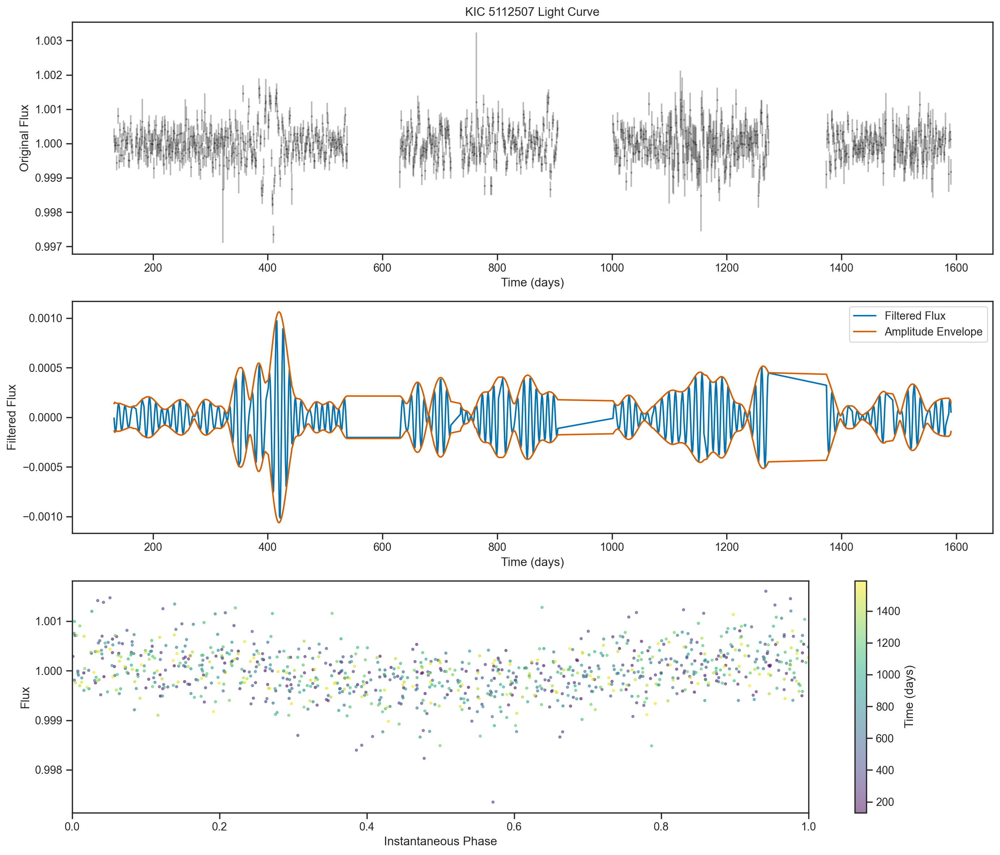

In [101]:
plot_hilbert_phase_tracking(kepler_id, times_, fluxes_, sigmas_,period_ls)

In [90]:
model_2 = harmonic_sho_model(times_, fluxes_, sigmas_, binned_quarters, f_best*2, 0.1, psd_freq=frequencies, predict_flux=True)

In [91]:
trace_2 = pm.sample(tune=5000, draws=5000, cores=4, chains=2, model=model_2, progressbar=True, init='adapt_full')

Auto-assigning NUTS sampler...
Initializing NUTS using adapt_full...
/Users/sabina/miniconda3/envs/jax-env/lib/python3.12/site-packages/pymc/step_methods/hmc/quadpotential.py:754: UserWarning: QuadPotentialFullAdapt is an experimental feature
  warnings.warn("QuadPotentialFullAdapt is an experimental feature")
Multiprocess sampling (2 chains in 2 jobs)
NUTS: [log_scale_factors_scaled, log_err_scale, log_period_scaled, sigma_scaled, frac, dQ1, dQb]


Output()

Sampling 2 chains for 5_000 tune and 5_000 draw iterations (10_000 + 10_000 draws total) took 35 seconds.
We recommend running at least 4 chains for robust computation of convergence diagnostics


In [92]:
trace_2 = trace_2.sel(chain=[get_best_chain(trace_2)[0]])

array([[<Axes: title={'center': 'scale_factors'}>,
        <Axes: title={'center': 'scale_factors'}>],
       [<Axes: title={'center': 'period'}>,
        <Axes: title={'center': 'period'}>],
       [<Axes: title={'center': 'f0'}>, <Axes: title={'center': 'f0'}>],
       [<Axes: title={'center': 'Q0'}>, <Axes: title={'center': 'Q0'}>],
       [<Axes: title={'center': 'Q1'}>, <Axes: title={'center': 'Q1'}>],
       [<Axes: title={'center': 'sigma'}>,
        <Axes: title={'center': 'sigma'}>],
       [<Axes: title={'center': 'frac'}>,
        <Axes: title={'center': 'frac'}>],
       [<Axes: title={'center': 'err_scale'}>,
        <Axes: title={'center': 'err_scale'}>]], dtype=object)

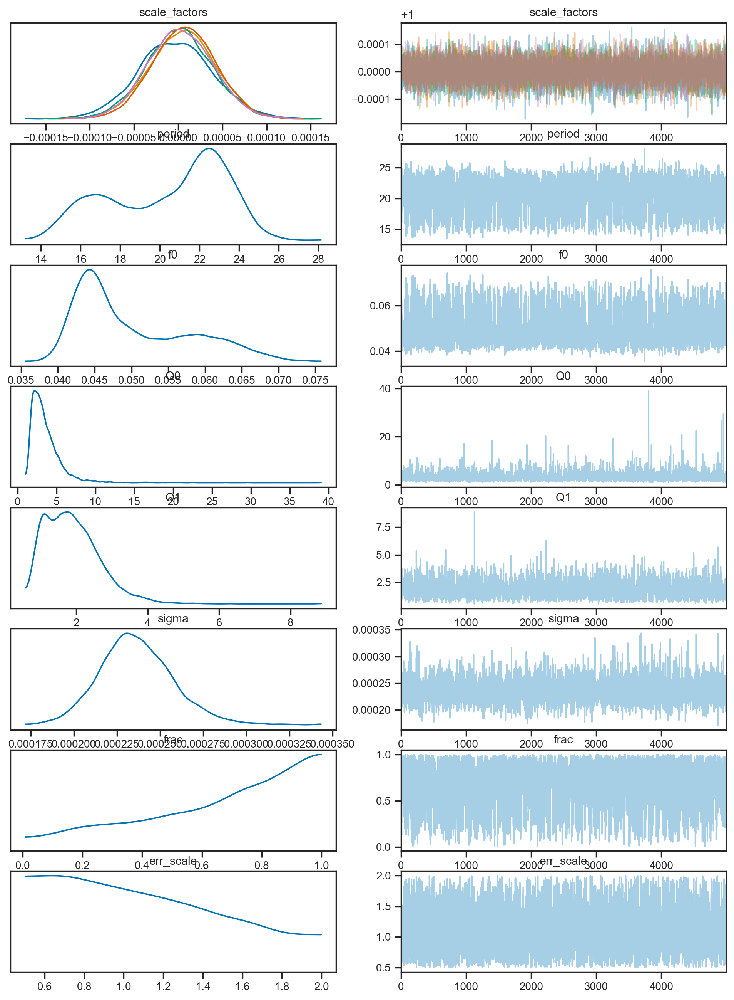

In [93]:
az.plot_trace(trace_2, var_names=['scale_factors', 'period', 'f0', 'Q0', 'Q1', 'sigma', 'frac', 'err_scale'])

Text(0.5, 1.0, '$P = {21.189}^{+2.092}_{-4.437} \\, \\mathrm{d}$')

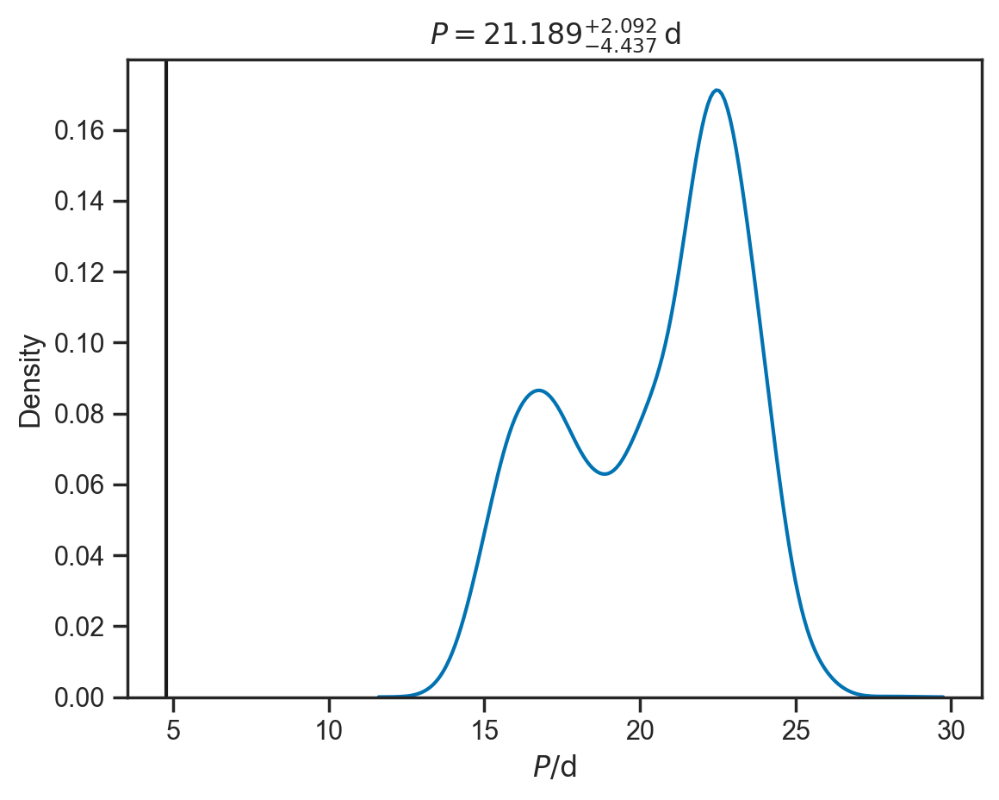

In [94]:
Ps = trace_2.posterior.period.values.flatten()
m, l, h = np.quantile(Ps, [0.5, 0.16, 0.84])


sns.kdeplot(Ps)
plt.axvline(1/f_best_literature, color='k')
plt.xlabel(r'$P / \mathrm{d}$')
plt.title(r'$P = {{{:.3f}}}^{{+{:.3f}}}_{{-{:.3f}}} \, \mathrm{{d}}$'.format(m, h-m, m-l))

In [95]:
model_4 = harmonic_sho_model(times_, fluxes_, sigmas_, binned_quarters, f_best*4, 0.1, psd_freq=frequencies, predict_flux=True)

In [96]:
trace_4 = pm.sample(tune=5000, draws=5000, cores=4, chains=2, model=model_4, progressbar=True, init='adapt_full')

Auto-assigning NUTS sampler...
Initializing NUTS using adapt_full...
/Users/sabina/miniconda3/envs/jax-env/lib/python3.12/site-packages/pymc/step_methods/hmc/quadpotential.py:754: UserWarning: QuadPotentialFullAdapt is an experimental feature
  warnings.warn("QuadPotentialFullAdapt is an experimental feature")
Multiprocess sampling (2 chains in 2 jobs)
NUTS: [log_scale_factors_scaled, log_err_scale, log_period_scaled, sigma_scaled, frac, dQ1, dQb]


Output()

Sampling 2 chains for 5_000 tune and 5_000 draw iterations (10_000 + 10_000 draws total) took 32 seconds.
There were 1 divergences after tuning. Increase `target_accept` or reparameterize.
We recommend running at least 4 chains for robust computation of convergence diagnostics


array([[<Axes: title={'center': 'scale_factors'}>,
        <Axes: title={'center': 'scale_factors'}>],
       [<Axes: title={'center': 'period'}>,
        <Axes: title={'center': 'period'}>],
       [<Axes: title={'center': 'f0'}>, <Axes: title={'center': 'f0'}>],
       [<Axes: title={'center': 'Q0'}>, <Axes: title={'center': 'Q0'}>],
       [<Axes: title={'center': 'Q1'}>, <Axes: title={'center': 'Q1'}>],
       [<Axes: title={'center': 'sigma'}>,
        <Axes: title={'center': 'sigma'}>],
       [<Axes: title={'center': 'frac'}>,
        <Axes: title={'center': 'frac'}>],
       [<Axes: title={'center': 'err_scale'}>,
        <Axes: title={'center': 'err_scale'}>]], dtype=object)

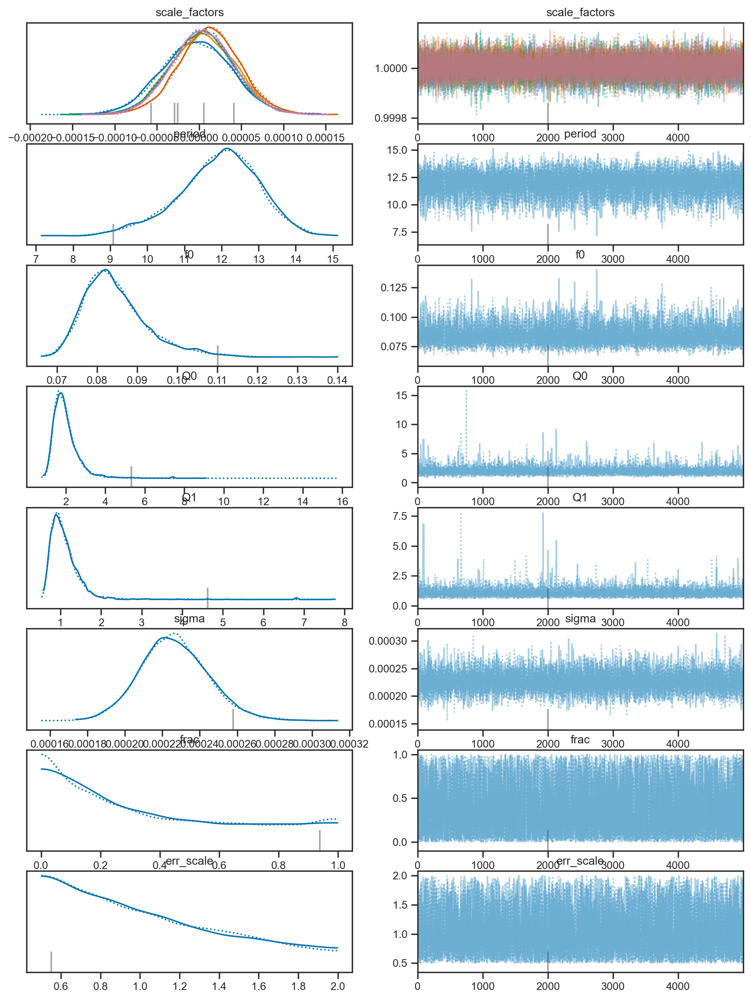

In [97]:
az.plot_trace(trace_4, var_names=['scale_factors', 'period', 'f0', 'Q0', 'Q1', 'sigma', 'frac', 'err_scale'])

Text(0.5, 1.0, '$P = {12.012}^{+0.941}_{-1.147} \\, \\mathrm{d}$')

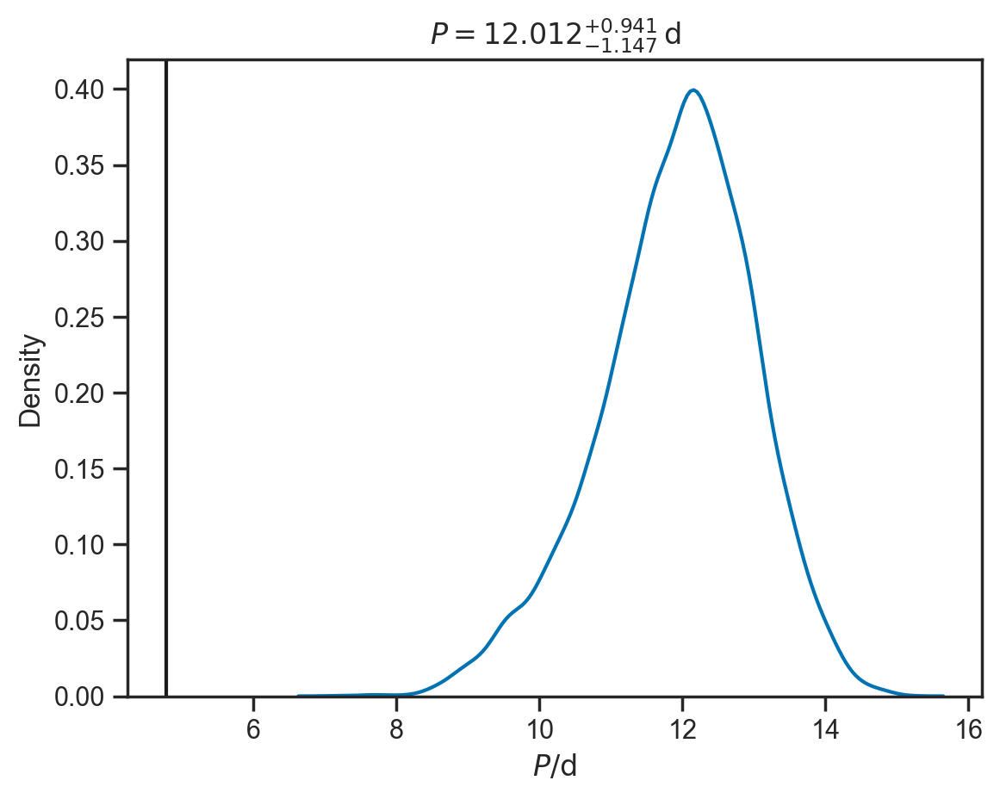

In [98]:
Ps = trace_4.posterior.period.values.flatten()
m, l, h = np.quantile(Ps, [0.5, 0.16, 0.84])


sns.kdeplot(Ps)
plt.axvline(1/f_best_literature, color='k')
plt.xlabel(r'$P / \mathrm{d}$')
plt.title(r'$P = {{{:.3f}}}^{{+{:.3f}}}_{{-{:.3f}}} \, \mathrm{{d}}$'.format(m, h-m, m-l))

In [101]:
model_8 = harmonic_sho_model(times_, fluxes_, sigmas_, binned_quarters, f_best*8, 0.1, psd_freq=frequencies, predict_flux=True)

In [102]:
trace_8 = pm.sample(tune=5000, draws=5000, cores=4, chains=2, model=model_8, progressbar=True, init='adapt_full')

Auto-assigning NUTS sampler...
Initializing NUTS using adapt_full...
/Users/sabina/miniconda3/envs/jax-env/lib/python3.12/site-packages/pymc/step_methods/hmc/quadpotential.py:754: UserWarning: QuadPotentialFullAdapt is an experimental feature
  warnings.warn("QuadPotentialFullAdapt is an experimental feature")
Multiprocess sampling (2 chains in 2 jobs)
NUTS: [log_scale_factors_scaled, log_err_scale, log_period_scaled, sigma_scaled, frac, dQ1, dQb]


Output()

Sampling 2 chains for 5_000 tune and 5_000 draw iterations (10_000 + 10_000 draws total) took 31 seconds.
We recommend running at least 4 chains for robust computation of convergence diagnostics


array([[<Axes: title={'center': 'scale_factors'}>,
        <Axes: title={'center': 'scale_factors'}>],
       [<Axes: title={'center': 'period'}>,
        <Axes: title={'center': 'period'}>],
       [<Axes: title={'center': 'f0'}>, <Axes: title={'center': 'f0'}>],
       [<Axes: title={'center': 'Q0'}>, <Axes: title={'center': 'Q0'}>],
       [<Axes: title={'center': 'Q1'}>, <Axes: title={'center': 'Q1'}>],
       [<Axes: title={'center': 'sigma'}>,
        <Axes: title={'center': 'sigma'}>],
       [<Axes: title={'center': 'frac'}>,
        <Axes: title={'center': 'frac'}>],
       [<Axes: title={'center': 'err_scale'}>,
        <Axes: title={'center': 'err_scale'}>]], dtype=object)

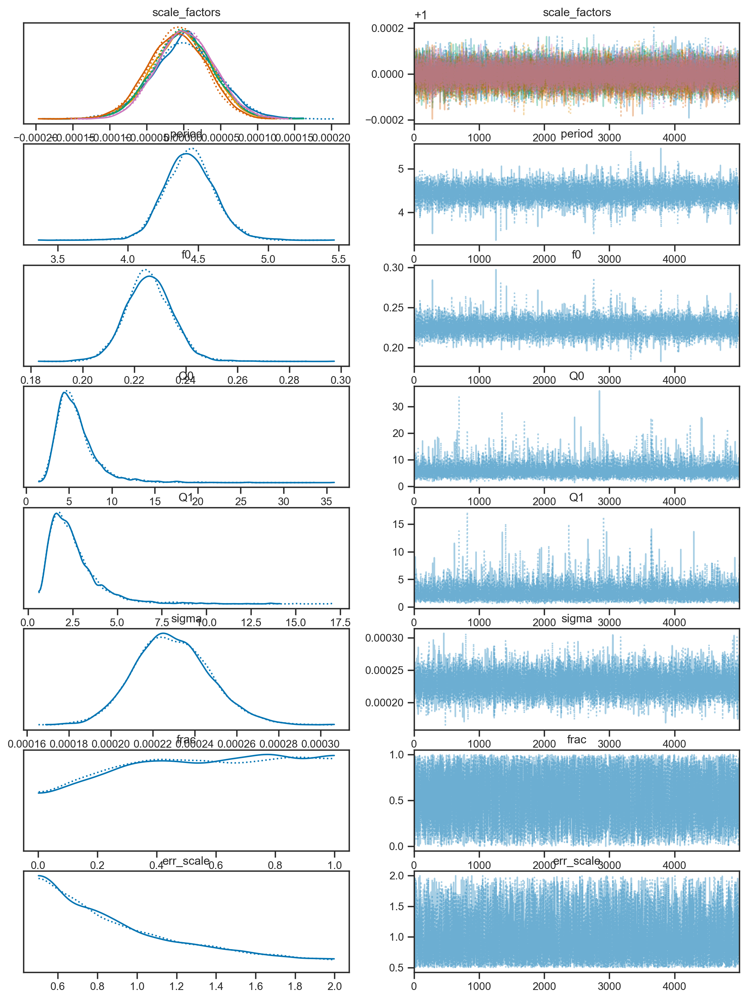

In [103]:
az.plot_trace(trace_8, var_names=['scale_factors', 'period', 'f0', 'Q0', 'Q1', 'sigma', 'frac', 'err_scale'])

In [104]:
best_chain_idx, best_lp = get_best_chain(trace)
best_chain_idx_half, best_lp_half = get_best_chain(trace_half)
best_chain_idx_4, best_lp_4 = get_best_chain(trace_4)
best_chain_idx_2, best_lp_2 = get_best_chain(trace_2)
best_chain_idx_8, best_lp_8 = get_best_chain(trace_8)

In [105]:
best_lp, best_lp_half, best_lp_2, best_lp_4, best_lp_8

(835.0670201762642,
 811.7521817995881,
 838.6771842212598,
 831.7758083613103,
 838.0103075138218)

(0.0, 2.0)

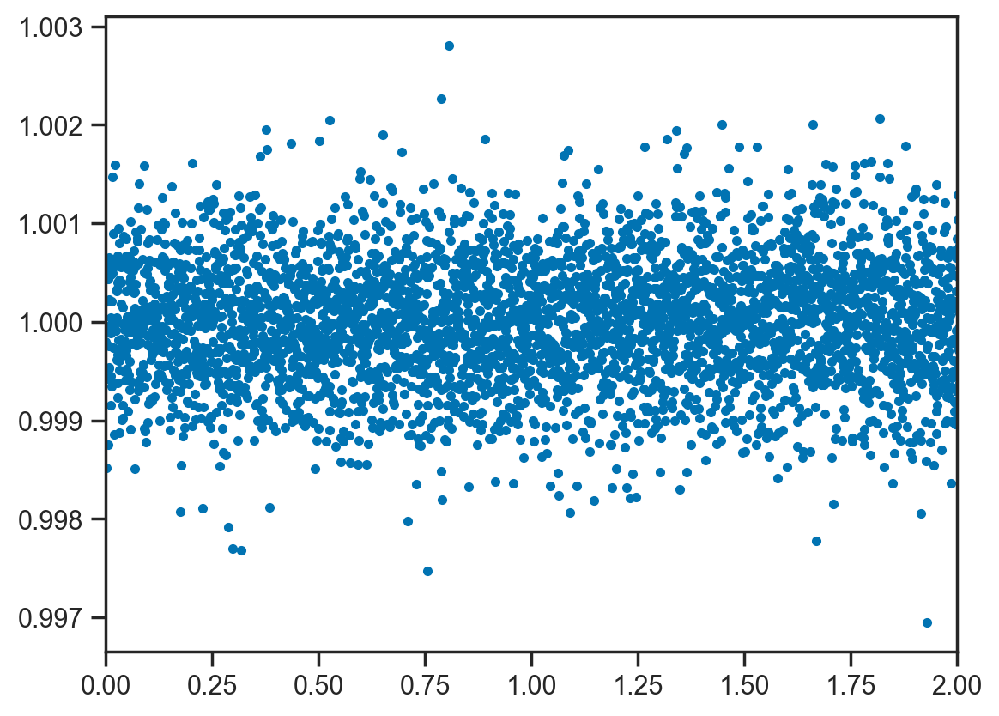

In [175]:
plt.plot(times[:10000]%5.3, fluxes[:10000], '.')
plt.xlim(0,2)